# Lab 4: Reconstruction from two views (knowing internal camera parameters)

In this lab you will learn how to triangulate the matching correspondences between two views of the same scene, by means of applying the Direct Linear Method (DLT). Then you will compute the camera matrices of these images given the Fundamental Matrix and the Intrinsic Matrix, and will evaluate your triangulation method on these camera matrices by estimating the reprojetion error in the triangulation. 

The last two tasks will involve the computation of depht maps by local methods (SSD, NCC), with their evaluation, and the implementation of bilateral weights on this mapping. 

The following file combines some text cells (Markdown cells) and code cells. Some parts of the code need to be completed. All tasks you need to complete are marked in <span style='color:Green'> green.  </span>

In [ ]:
!apt-get update
!apt-get install ffmpeg libsm6 libxext6  -y
!pip install opencv-python

Get:1 http://security.debian.org/debian-security buster/updates InRelease [65.4 kB]
Get:2 http://deb.debian.org/debian buster InRelease [122 kB]
Get:3 http://deb.debian.org/debian buster-updates InRelease [51.9 kB]
Get:4 http://security.debian.org/debian-security buster/updates/main amd64 Packages [314 kB]
Get:5 http://deb.debian.org/debian buster/main amd64 Packages [7,906 kB]
Get:6 http://deb.debian.org/debian buster-updates/main amd64 Packages [8,792 B]
Fetched 8,468 kB in 3s (2,973 kB/s)




libsm6 is already the newest version (2:1.2.3-1).
libsm6 set to manually installed.
libxext6 is already the newest version (2:1.3.3-1+b2).
libxext6 set to manually installed.
The following additional packages will be installed:
  i965-va-driver intel-media-va-driver libaacs0 libaom0 libasound2
  libasound2-data libass9 libasyncns0 libavc1394-0 libavcodec58 libavdevice58
  libavfilter7 libavformat58 libavresample4 libavutil56 libbdplus0 libbluray2
  libbs2b0 libcaca0 libcap2 libcdio-cdda2 libcdi

In [ ]:
from IPython.display import display, HTML
import numpy as np
from numpy import linalg as LA
import cv2
import math
import sys
import random
import matplotlib
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import axes3d
matplotlib.rcParams['figure.figsize'] = (19, 10)
from operator import itemgetter

import utils
from utils import homogeneous2euclidean, euclidean2homogeneous, projective2img, img2projective
import aux_code as aux

np.set_printoptions(precision=3)

# **1. Triangulation**

The first task is to implement the DLT method that will compute the 3D points corresponding to the matches of two images whose camera matrices are known.

![image](https://user-images.githubusercontent.com/8356912/151347636-c3332917-a7da-402e-9eb6-f39beb91591a.png)


<span style='color:Green'> - Create the function triangulate(x1, x2, P1, P2, imsize) that performs a triangulation with the homogeneous algebraic method (DLT)  </span>

The entries are (x1, x2, P1, P2, imsize), where:
- x1: array of shape (3, `n_points`), containing matching points in projective coordinates from Camera 1 reference frame 
- x2: array of shape (3, `n_points`), containing matching points in projective coordinates from Camera 2 reference frame.
- P1: Camera 1 matrix
- P2: Camera 2 matrix 
- imsize: Iterable with shape (2,) with the image size

The function should return:
- X: array of shape (4, `n_points`), contaning the Homogenous Coordinates of the points in 3D space.  

Test the triangulate function: use this code to validate that the function triangulate works properly


In [ ]:
def Normalise_last_coord(x):
    xn = x  / x[-1,:]
    return xn

In [ ]:
# Write here the method for DLT triangulation
def triangulate(x1, x2, P1, P2, imsize) -> np.ndarray:
    assert P1.shape == (3,4) == P2.shape
    assert x1.shape == x2.shape and x1.shape[0] == 3
    '''
    Your implementation here
    '''
    nx = imsize[0]
    ny = imsize[1]
    H = np.array([[2/nx,    0, -1],
                  [   0, 2/ny, -1],
                  [   0,    0,  1]])

    # Normalization
    x1 = Normalise_last_coord(H @ Normalise_last_coord(x1))
    x2 = Normalise_last_coord(H @ Normalise_last_coord(x2))
    P1 = H @ P1
    P2 = H @ P2

    X = []
    for point_x1, point_x2 in zip(x1.T, x2.T):
        A = np.array([point_x1[0] * P1[2] - P1[0],
                       point_x1[1] * P1[2] - P1[1],
                       point_x2[0] * P2[2] - P2[0],
                       point_x2[1] * P2[2] - P2[1]])

        U,D,Vt = np.linalg.svd(A)
        X.append(Vt[-1, :])

    X = np.array(X).T

    #raise NotImplementedError("You must implement this, don't forget")

    return X
    

#### Test the triangulation function with two Cameras and some random points.


In [ ]:
P1 = np.zeros((3,4))
P1[0,0]=P1[1,1]=P1[2,2]=1                            # Cam1 Canonical Camera Matrix

angle = 15
theta = np.radians(angle)
c = np.cos(theta)
s = np.sin(theta)
R = np.array([[c, -s, 0], [s, c, 0], [0, 0, 1]])     # Cam2 Rotation_z(theta[deg])
t = np.array([[1.1, .1, .2]])                        # Cam2 Translation(x[m], y[m], z[m]) 
P2 = np.concatenate((R, t.T), axis=1)

n_points = 20                                        # Number of data samples (points) (x,y,z)
X_eucl = np.random.uniform(0, 1, (3,n_points))       # Random points in 3D space on world reference frame
X_eucl[2,:] += 3                                     # Make points fit into the camera frame 
X = euclidean2homogeneous(X_eucl)                    # 

# Obtain the camera coordinates (rays) from each point.
x_proj1 = P1 @ X                                     # Project to Cam1 image coordinates (x,y,z)->[x_c1:y_c1:z_c1]
x_proj2 = P2 @ X                                     # Project to Cam2 image coordinates (x,y,z)->[x_c2:y_c2:z_c2]

# Estimate the 3D points (you need to create this function)
X_trian = triangulate(x_proj1, x_proj2, P1, P2, ((2,2)));
assert X_trian.shape == (4, n_points)

# Evaluation: compute the reprojection error
X_eucl_pred = homogeneous2euclidean(X_trian)
X_eucl = homogeneous2euclidean(X)
errors = np.linalg.norm(X_eucl - X_eucl_pred, axis=0)
avg_error = np.mean(errors)
print(f"Average triangulation error: {avg_error:.2e}[m]")
assert avg_error < 1e-8, "Something might be wrong here"

Average triangulation error: 1.62e-15[m]


Lets visualize the points

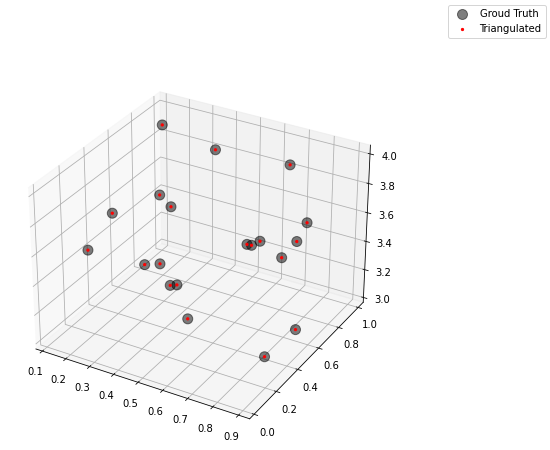

In [ ]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(projection='3d')
utils.draw_points(X_eucl.T, ax=ax, c="k", alpha=0.5, s=100, depthshade=True, label="Groud Truth")
utils.draw_points(X_eucl_pred.T, ax=ax, c="r", alpha=1, s=5, depthshade=True, label="Triangulated")
fig.legend()

# 2. Reconstruction) from two views

The goal of this section is to estimate the 3D reconstruction from two views in a practical situation where the image correspondences contain outliers. 

![image](https://user-images.githubusercontent.com/8356912/151348379-970238b2-7a62-4c3c-adbc-4de233c3679a.png)

To acomplish this you have to:

1. Find a set of point correspondaces between the two images. This correspondaces will contain noise/outliers, therefore we cannot use Epipolar Geometry to calculate the Essential Matrix, but we can find the Fundamental Matrix. 
2. Estimate the Fundamental Matrix relating the two camera Images. Since correspondances are noisy we will use the 8-point Algorithm in combination with the RANSAC algorithm, to find a good estimate of $F$.
3. Calculate the Essential Matrix from the Fundamental Matrix
4. Find the two Camera Matrices.

## 2.1 Estimate the image matches


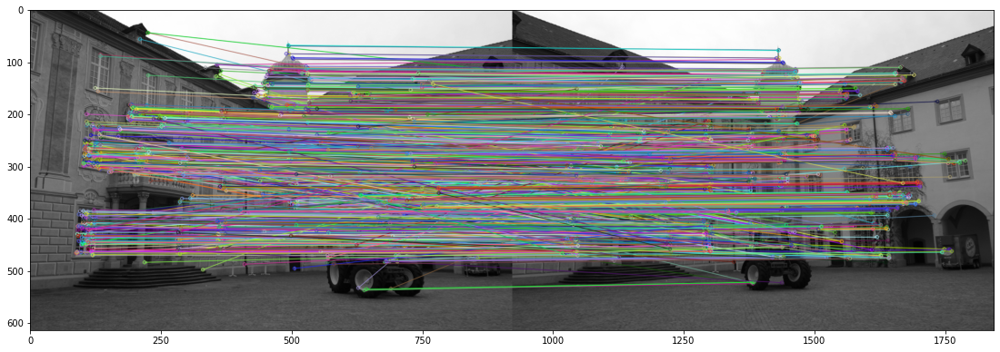

In [ ]:
# Read images
img1 = cv2.imread('Data/0001_s.png',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/0002_s.png',cv2.IMREAD_GRAYSCALE)
h, w = img1.shape

# Initiate ORB detector
orb = cv2.ORB_create(3000)
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

# Keypoint matching
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1,des2)

# Show "good" matches
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
fig = plt.figure()
plt.imshow(img_12)
plt.show()

## 2.2 Estimate Fundamental Matrix
To find the Fundamental Matrix $F$ we will use the 8-point algorithm. However, using only 8 correspondances might lead to bad estimates of $F$. To find a robust estimate we will use the RANSAC algorithm. In simple words the algorithm samples randomly 8 correspondances and estimates $F_{estimated}$ for these samples, then it evaluates how well does $F_{estimated}$ fit the rest of the data. We repreat this process until a limit of iterations is reached and select the best estimated $F$.  

Then we filter our set of correspondances to those that behave accordingly to our estimated $F$.

(Code is provided)

2244 631


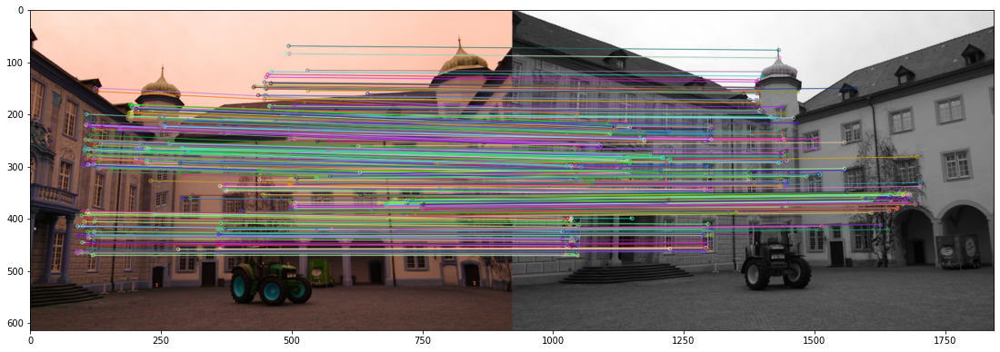

In [ ]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []
for m in matches:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches = aux.Ransac_fundamental_matrix(points1, points2, 1, 5000)
inlier_matches = itemgetter(*indices_inlier_matches)(matches)

img_12 = cv2.drawMatches(img1,kp1,img2,kp2,inlier_matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
fig = plt.figure()
plt.imshow(img_12)
plt.show()

## 2.3 Estimate the Essential Matrix
<span style='color:Green'> - Compute the Essential matrix from the Fundamental matrix </span>

In [ ]:
# Camera calibration matrix
K = np.array([[2362.12, 0, 1520.69], [0, 2366.12, 1006.81], [0, 0, 1]])
scale = 0.3;
H = np.array([[scale, 0, 0], [ 0, scale, 0], [0, 0, 1]])
K = H @ K;

def essential_from_fundamental(K, F):
    E = K.T @ F @ K
    return E

    #raise NotImplementedError()

E = essential_from_fundamental(K, F)

## 2.4. Estimate the Camera Matrices from the Essential Matrix
<span style='color:Green'> - Estimate the camera projection matrices. Assuming the first Camera has a cannonical matrix you will obtain four possible Camera Matrices for the second camera, two rotations and two translations.</span>

 - Please explain how do you obtain these estimates, not what algorighm or methodology you used to obtain them. i.e., What system of equations are you solving?
 - Why do you obtain 4 solutions? Why not only one?
 - Why is there a reprojection error ? From where comes the uncertainty ?

HINT: Once you estimate the rotations $R$ and translation $T$ of the second camera matrix, you may get as results improper rotations: $|R| = -1$ i.e., $R \in O(3), R \notin SO(3)$. <span style='color:Green'> (Why do you think this happens?) </span> In that case you should make the rotation proper by avoiding the unwanted reflexion (multiply by -1 so $|R| = 1$): e.g.,
  
      if det(R) < 0  
          R = -R;  
      endif  

In [ ]:
# camera projection matrix for the first camera
P1 = np.eye(3,4)  # [I|0] canonical camera
P1 = K @ P1  # denormalize

W = np.array([[0, -1, 0],[1, 0, 0],[0, 0, 1]])
Z = np.array([[0, 1, 0],[-1, 0, 0],[0, 0, 0]])
assert np.alltrue(Z @ W == np.diag((1,1,0)))

U,d,Vt = np.linalg.svd(E)
u3 = U[:,-1]

# four possible matrices for the second camera
Pc2 = [np.zeros((3,4)), np.zeros((3,4)), np.zeros((3,4)), np.zeros((3,4))]
Pc2[0][:,:3] = U @ W @ Vt
Pc2[0][:, 3] = u3
Pc2[1][:,:3] = U @ W @ Vt
Pc2[1][:, 3] = -u3
Pc2[2][:,:3] = U @ W.T @ Vt
Pc2[2][:, 3] = u3
Pc2[3][:,:3] = U @ W.T @ Vt
Pc2[3][:, 3] = -u3

for idx in range(4):
    if np.linalg.det(Pc2[idx][:,:3]) < 0:
        Pc2[idx] = -Pc2[idx]  # proper rotations
    Pc2[idx] = K @ Pc2[idx]   # denormalize camera matrices

Lets visualize the 4 possible Camera positions and orientations, in relation to Camera 1 

(-1.5, 1.5)

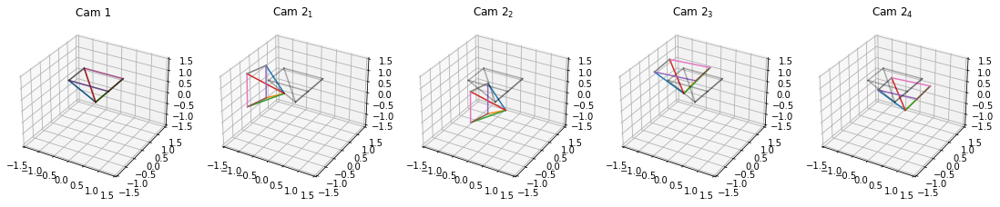

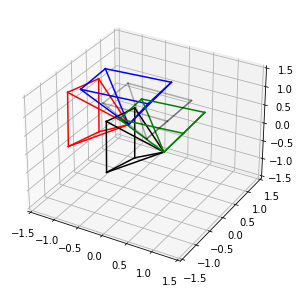

In [ ]:
# plot the first camera and the four possible solutions for the second figure:
fig = plt.figure()
axs = [fig.add_subplot(1,5,i+1, projection='3d') for i in range(5)]
titles = ["Cam 1"] + [r"Cam $2_{%s}$" % int(i+1) for i in range(len(Pc2)) ]

low_lim, up_lim = -1.5, 1.5
for ax, title, P in zip(axs, titles, [P1] + Pc2):
    utils.plot_camera(P,w,h, 1, ax=ax)
    utils.plot_camera(P1,w,h, 1, ax=ax, alpha=0.3, color="k") # Show Cam1 for reference
    ax.set_title(title)
    ax.set_xlim(low_lim, up_lim)
    ax.set_ylim(low_lim, up_lim)
    ax.set_zlim(low_lim, up_lim)
    
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1,1,1, projection='3d')
for P, color in zip(Pc2, ['r','k','b','g']):
    utils.plot_camera(P,w,h, 1, ax=ax, color=color)
utils.plot_camera(P1,w,h, 1, ax=ax, alpha=0.3, color="k") # Show Cam1 for reference
ax.set_xlim(low_lim, up_lim)
ax.set_ylim(low_lim, up_lim)
ax.set_zlim(low_lim, up_lim)

<span style='color:Green'> - Triangulate the correspondances and select the "optimal" camera, how do you select it ?</span>
   

Correct camera: 3


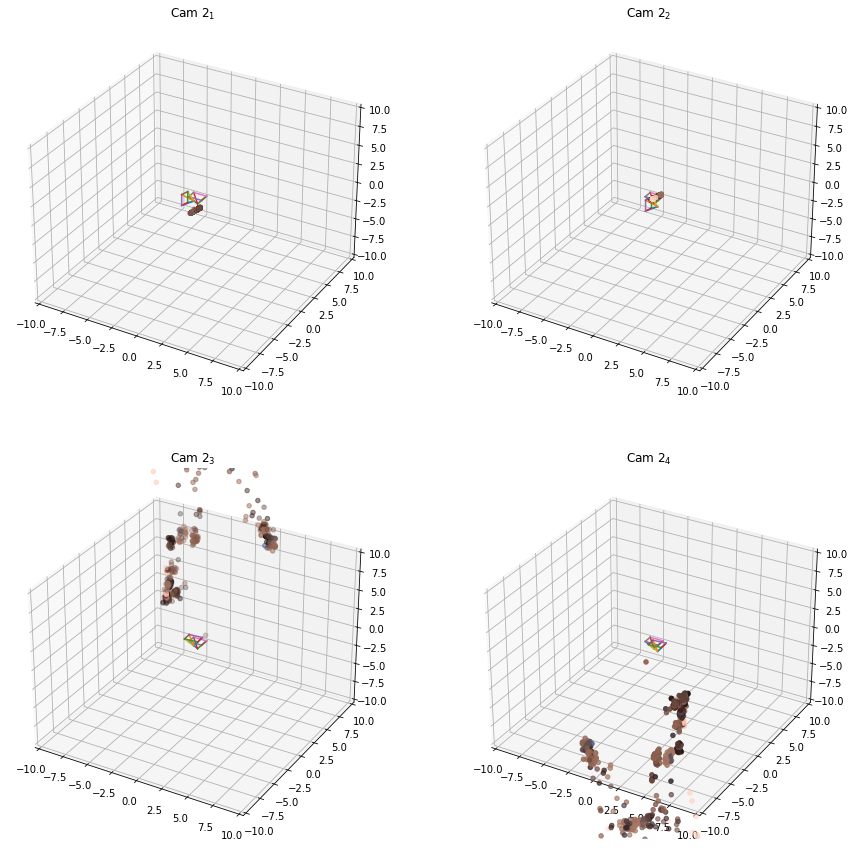

In [ ]:
img1 = cv2.imread('Data/0000_s.png',cv2.IMREAD_UNCHANGED)


# Obtain the inlier points projective coordinates for Camera 1 and 2 
x1 = points1[:, indices_inlier_matches]
x2 = points2[:, indices_inlier_matches]

# Prepare figure 
fig = plt.figure(figsize=(15,15))
axs = [fig.add_subplot(2,2,i+1, projection='3d') for i in range(4)]

# Variable for optimal camera
P2_selected = None

low_lim, up_lim = -10, 10
for i, ax, P2 in zip(range(len(Pc2)), axs, Pc2):
    # Estimate by triangulization the 3D coordinates of the matches
    X_pred = triangulate(x1, x2, P1, P2, [w, h])
    X_eucl = homogeneous2euclidean(X_pred)
    
    # Render the 3D point cloud
    x_img = np.transpose(x1[:2]).astype(int)
    rgb_txt = (img1[x_img[:,1], x_img[:,0]])/255
    utils.draw_points(X_eucl.T, color=rgb_txt, ax=ax)
    utils.plot_camera(P1,w,h,1, ax=ax);
    utils.plot_camera(P2,w,h,1, ax=ax);
    ax.set_title(r"Cam $2_{%d}$" % (i+1))
    ax.set_xlim(low_lim, up_lim)
    ax.set_ylim(low_lim, up_lim)
    ax.set_zlim(low_lim, up_lim)
    
    # Select the best camera using some metric
    X_cam1 = P1 @ Normalise_last_coord(X_pred)  # X in camera coordinates
    X_cam2 = P2 @ Normalise_last_coord(X_pred)
    both_in_front = np.alltrue(X_cam1[2] > 0) and np.alltrue(X_cam2[2] > 0)  # z > 0
    if both_in_front:
        P2_selected = P2
        print(f"Correct camera: {i+1}")

# From now own P2 will be the camera you selected
P2 = P2_selected

Once you selected a Camera, analyze the error of reprojecting the 3D space back to image coordinates. 

<span style='color:Green'>- Compute the reprojection errors  </span>
<span style='color:Green'>- Plot the histogram of reprojection errors, </span>
<span style='color:Green'>- Plot the mean reprojection error  </span>

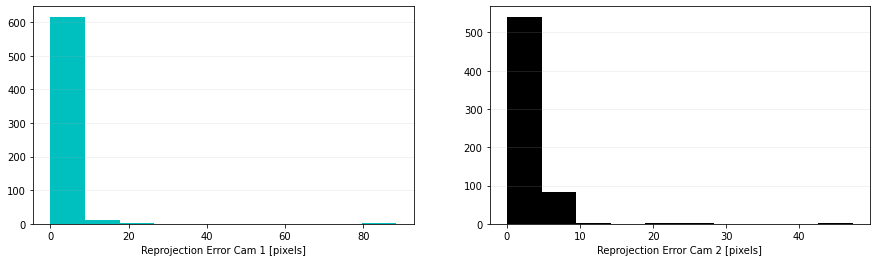

In [ ]:
def reprojection_errors(x1, x2, P1, P2, X):
    """
    - x1: array of shape (3, `n_points`), containing matching points in projective coordinates from Camera 1 reference frame 
    - x2: array of shape (3, `n_points`), containing matching points in projective coordinates from Camera 2 reference frame.
    - P1: Camera 1 matrix
    - P2: Camera 2 matrix 
    - X: (4, `n_points`) homogenous coordinates of points in 3D space
    Compute the reprojection error from `X` to each of the camera's projective coordinates
    @return: (cam1_errors, cam2_errors)
    """
    # homogeneous to cartesians
    x1_img = projective2img(x1)
    x2_img = projective2img(x2)

    x1_img_pred = P1 @ X
    x1_img_pred = projective2img(x1_img_pred)

    x2_img_pred = P2 @ X
    x2_img_pred = projective2img(x2_img_pred)

    cam1_errors = np.sum((x1_img-x1_img_pred)**2, axis=0)
    cam2_errors = np.sum((x2_img-x2_img_pred)**2, axis=0)

    return cam1_errors, cam2_errors

def plot_error_stats(cam1_errors, cam2_errors):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,4))
    
    ax1.hist(cam1_errors, color='c')
    ax1.grid(axis='y', alpha=0.2)
    ax1.set_xlabel("Reprojection Error Cam 1 [pixels]")  # pixel-sized units (euclidean dist.)
    ax2.hist(cam2_errors, color='k')
    ax2.grid(axis='y', alpha=0.2)
    ax2.set_xlabel("Reprojection Error Cam 2 [pixels]")


# Get projections with selected Camera 
X_pred = triangulate(x1, x2, P1, P2, [w, h])

cam1_errors, cam2_errors = reprojection_errors(x1, x2, P1, P2, X_pred)

plot_error_stats(cam1_errors, cam2_errors)

# Depth map computation - Stereo Matching

<span style='color:Green'> - Write a function called 'stereo_computation' that computes the disparity between a pair of rectified images, the class/es should compute the depth map for sections 3, 4, 5, and 6 </span>

Computational Efficiency is not a requirement but a plus.

![image](https://user-images.githubusercontent.com/8356912/151308788-854ad073-48b3-495a-af4c-dea99f4343d9.png)

**Optional:** You can also compute the depth map knowing *a priori* the focal length and baseline of the camera configuration (source: https://vision.middlebury.edu/stereo/data/scenes2014/)

In [ ]:
from tqdm import tqdm
from concurrent import futures
import multiprocessing
from joblib import Parallel, delayed
import numpy as np

def ssd_cost(left_patch, right_patch, w):
  """
  Return SSD cost given a weight matrix w
  """
  cost = np.sum(w*(left_patch - right_patch)**2)
  return cost

def average_weight(left_patch):
  """
  Return a weight matrix that gives equal importance to every weight
  """
  weight_map = np.ones_like(left_patch)
  weight_map = weight_map / weight_map.sum()
  return weight_map
    
matching_costs_dict = {}
matching_costs_dict["SSD"] = ssd_cost

def compute_disparity_at_i(left_img, right_img, i, padding, w, min_disparity, max_disparity, matching_cost, create_weight_fn):
    """
    :param left_img: Left rectified image
    :param right_img: Right rectified image
    :param i: Row at which we compute the disparity
    :param padding: Padding (window size divided by 2)
    :param w: Width of image
    :param min_disparity: Minimum disparity
    :param max_disparity: Maximum disparity
    :param matching_cost: Method for matching ("SSD" / "NCC")
    :param create_weight_fn: Function to create weight matrix 
    Compute disparity at row i
    """
    disparity_map = np.zeros((w))
    for j in range(padding, w-padding):
        left_patch = left_img[i - padding:i + padding + 1, \
                            j - padding:j + padding + 1].astype(np.float64)
        costs = []
        possible_ks = np.concatenate([np.arange(j-max_disparity, j-min_disparity), \
                        np.arange(j+min_disparity, j+max_disparity)])
        possible_ks = possible_ks[np.logical_and(possible_ks >= padding, possible_ks < w-padding)]

        for k in possible_ks: # It only makes sense to search in one direction
            right_patch = right_img[i - padding:i + padding + 1, \
                            k - padding:k + padding + 1].astype(np.float64)

            weight_map = create_weight_fn(left_patch)
            costs.append(matching_costs_dict[matching_cost](left_patch, right_patch, weight_map))

        max_pos = np.argmin(np.array(costs))+np.min(possible_ks)

        disparity_map[j] = abs(j - max_pos)
    return disparity_map

def stereo_computation(left_img, right_img, min_disparity, max_disparity, win_size, method, **method_kwargs):
    """
    :param left_img: Left rectified image
    :param right_img: Right rectified image
    :param min_disparity: Minimum disparity
    :param max_disparity: Maximum disparity
    :param win_size: Window size for the local method
    :param method: Method for matching ("SSD" / "NCC")
    :param method_kwargs: Extra parameters
    :return: 
    """

    create_weight_fn=method_kwargs["create_weight_fn"]
    parallelize=method_kwargs["parallelize"]
    progress_bar=method_kwargs["progress_bar"]

    assert window_size > 1 and window_size % 2 == 1, "Window size must be greater than 1 and odd"
    assert method in matching_costs_dict.keys() , "Invalid matching cost, must be SSD or NCC"

    left_img= left_img.astype(np.float64)
    right_img= right_img.astype(np.float64)

    h, w = left_img.shape[0], left_img.shape[1]
    rh, rw = right_img.shape[0], right_img.shape[1]
    center_l, center_r = right_img.shape[1]//2, right_img.shape[1]//2

    padding = win_size//2

    disparity_map = np.zeros_like(left_img)

    if parallelize:
        params = {"n_jobs": 16}
        if progress_bar:
            params["verbose"] = 10
        res = Parallel(**params)(delayed(compute_disparity_at_i)(left_img, right_img, i, padding, w, min_disparity, max_disparity, method, create_weight_fn) for i in range(padding, h-padding))
    else:
        res = [compute_disparity_at_i(left_img, right_img, i, padding, w, min_disparity, max_disparity, method, create_weight_fn) for i in tqdm(range(padding, h-padding))]

    res = [np.zeros((padding, w))] + res + [np.zeros((padding, w))]
    return np.vstack(res)

We can also define a vectorized version for the SSD for each row: 

In [ ]:
def im2col_sliding_broadcasting(img_slice, block_size, stepsize=1):
    """
    Convert blocks corresponding to sliding a window with block size block_size and returns it as a matrix
    """
    # Parameters
    M, N = img_slice.shape
    col_extent = N - block_size[1] + 1
    row_extent = M - block_size[0] + 1

    # Get Starting block indices
    start_idx = np.arange(block_size[0])[:,None]*N + np.arange(block_size[1])

    # Get offsetted indices across the height and width of input array
    offset_idx = np.arange(row_extent)[:,None]*N + np.arange(col_extent)

    # Get all actual indices & index into input array for final output
    res = np.take (img_slice, start_idx.ravel()[:,None] + offset_idx.ravel()[::stepsize])
    return res

def compute_disparity_at_i_vectorized(left_img, right_img, i, win_size, min_disparity, max_disparity, matching_cost, create_weight_fn):
    """
    :param left_img: Left rectified image
    :param right_img: Right rectified image
    :param i: Row at which we compute the disparity
    :param padding: Padding (window size divided by 2)
    :param w: Width of image
    :param min_disparity: Minimum disparity
    :param max_disparity: Maximum disparity
    :param matching_cost: Method for matching ("SSD" / "NCC")
    :param create_weight_fn: Function to create weight matrix 
    Compute disparity at row i
    """
    padding = win_size//2

    infnty = 9999
    diff_disp = max_disparity-min_disparity
    left_slice = left_img[i - padding:i + padding + 1, :].astype(np.float64)
    right_slice= right_img[i - padding:i + padding + 1, :].astype(np.float64)
    left_slice = im2col_sliding_broadcasting(left_slice, [win_size, win_size]).transpose(1, 0)
    right_slice = im2col_sliding_broadcasting(right_slice, [win_size, win_size]).transpose(1, 0)
    
    weight_matrix = create_weight_fn(np.ones((win_size, win_size)))
    
    if matching_cost == "SSD":
        padded_right_slice = np.concatenate([np.ones((diff_disp, right_slice.shape[1]))*infnty, right_slice, np.ones((diff_disp, right_slice.shape[1]))*infnty], axis=0)
        right_comp = [padded_right_slice[np.concatenate([np.arange(i-max_disparity, i-min_disparity), np.arange(i+min_disparity, i+max_disparity)]), :] for i in np.arange(diff_disp, padded_right_slice.shape[0]-diff_disp)]

        diff = (left_slice.reshape(left_slice.shape[0],1,left_slice.shape[1])-right_comp)**2
        weight_matrix = weight_matrix.flatten()
        diff = weight_matrix.reshape(1, 1, weight_matrix.shape[0])*diff
        diff = np.sum(diff, axis=2)
        disp = np.abs(np.argmin(diff, axis=1)-max_disparity)
    

    return disp

def stereo_computation_vectorized(left_img, right_img, min_disparity, max_disparity, win_size, method, **method_kwargs):
    """
    :param left_img: Left rectified image
    :param right_img: Right rectified image
    :param min_disparity: Minimum disparity
    :param max_disparity: Maximum disparity
    :param win_size: Window size for the local method
    :param method: Method for matching ("SSD" / "NCC")
    :param method_kwargs: Extra parameters
    :return: 
    """
    
    create_weight_fn = method_kwargs["create_weight_fn"]
    
    left_img = left_img.astype(np.float64)
    right_img = right_img.astype(np.float64)
    lh, lw = left_img.shape[0], left_img.shape[1]
    rh, rw = right_img.shape[0], right_img.shape[1]
    disparity_map = np.zeros_like(left_img)
    padding = win_size//2
    
    res = [compute_disparity_at_i_2(left_img, right_img, i, win_size, min_disparity, max_disparity, method, create_weight_fn) for i in tqdm(range(padding, lh-padding))]
    disparity_map[padding:lh-padding, padding:lw-padding] = np.vstack(res)
    return disparity_map

### 3. Depth map computation with local methods (SSD)
__Data images: 'scene1.row3.col3.ppm','scene1.row3.col4.ppm'  
Disparity ground truth: 'truedisp.row3.col3.pgm'__

In this part we ask to implement only the SSD cost

<span style='color:Green'> - Evaluate the results changing the window size (e.g. 3x3, 9x9, 21x21,31x31) and the Mean Square Error (MSE). Comment the results.  </span>

 **Note 1**: Use grayscale images  
 
 **Note 2**: For this first set of images use 0 as minimum disparity and 16 as the the maximum one.

![image](https://user-images.githubusercontent.com/8356912/151308710-679e9b2c-8dfc-48da-8378-a844b10ef4f7.png)

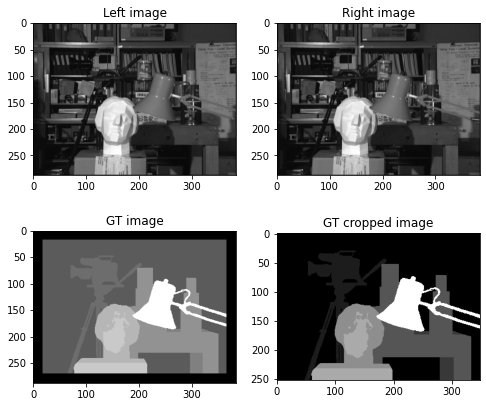

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read input images
left_img = cv2.imread("Data/scene1.row3.col3.ppm", 0)
right_img = cv2.imread("Data/scene1.row3.col4.ppm", 0)
# We have to divide the values of the true disparity by 8, as indicated in https://vision.middlebury.edu/stereo/data/scenes2001/
disparity_gt = cv2.imread("Data/truedisp.row3.col3.pgm", 0) / 8

# Plot images
fig, ax = plt.subplots(2, 2, figsize=(8, 7))

# Ground-truth images have padding of 18 pixels: https://vision.middlebury.edu/stereo/taxonomy-IJCV.pdf
gt_cropped = disparity_gt[18:-18, 18:-18]

ax[0,0].set_title("Left image")
ax[0,0].imshow(left_img, cmap='gray')
ax[0,1].set_title("Right image")
ax[0,1].imshow(right_img, cmap='gray')
ax[1,0].set_title("GT image")
ax[1,0].imshow(disparity_gt, cmap='gray')
ax[1,1].set_title("GT cropped image")
ax[1,1].imshow(gt_cropped, cmap='gray')

plt.show()

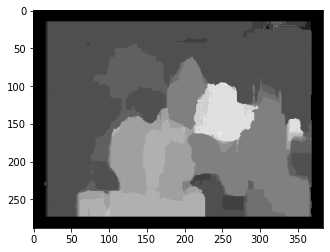

In [ ]:
min_disparity, max_disparity = 0, 16
window_size = 31
matching_cost = "SSD"

disparity_map = stereo_computation(left_img, right_img, min_disparity, \
                                   max_disparity, window_size, matching_cost, create_weight_fn=average_weight, parallelize=True, progress_bar=False)

plt.imshow(disparity_map, cmap='gray')
plt.show()

Here, we define functions to automatically compute the results of different combinations of parameters:

In [ ]:
from tqdm import tqdm
import time
import os
import matplotlib.pyplot as plt

def compute_mse(x1, x2):
    return np.sum((x1-x2)**2) / (x1.shape[0]*x1.shape[1])

def disp_map_combinations(left_img, right_img, matching_costs, window_sizes, disparities, experiment_name, folder_name="disparity_map_results"):
    """
    Compute disparity map combinations given a list of different window sizes, matching costs, and minimum and maximum disparities.
    """
    if not os.path.exists(os.path.join("Data", folder_name)):
        os.mkdir(os.path.join("Data", folder_name))
    if not os.path.exists(os.path.join("Data", folder_name, experiment_name)):
        os.mkdir(os.path.join("Data", folder_name, experiment_name))
    
    for w_size in tqdm(window_sizes):
        for matching_cost in matching_costs:
            for min_disparity, max_disparity in disparities:
                img_path = os.path.join("Data", folder_name, experiment_name, \
                                        str(w_size)+"_"+str(matching_cost)+"_"+str(min_disparity)+"_"+str(max_disparity)+".png")
                
                # If experiment has been already done, do not continue
                if not os.path.exists(img_path):
                    disp_map = stereo_computation(left_img, right_img, min_disparity, \
                                                  max_disparity, w_size, matching_cost, create_weight_fn=average_weight, parallelize=True, progress_bar=False)
                    # Crop disparity map
                    disp_map = disp_map[w_size//2:disp_map.shape[0]-w_size//2, w_size//2:disp_map.shape[1]-w_size//2]
                    cv2.imwrite(img_path, disp_map)
            
def show_disp_maps(gt, matching_costs, window_sizes, disparity, experiment_name, fig_size=(20, 10), folder_name="disparity_map_results"):
    """
    Compute disparity map combinations given a list of different window sizes, matching costs, and minimum and maximum disparities and show the results.
    """
    min_disparity, max_disparity = disparity[0], disparity[1]
    fig, ax = plt.subplots(len(matching_costs), len(window_sizes), figsize=fig_size)
    
    for i, w_size in tqdm(enumerate(window_sizes)):
        for j, matching_cost in enumerate(matching_costs):

            img_path = os.path.join("Data", folder_name, experiment_name, \
                                        str(w_size)+"_"+str(matching_cost)+"_"+str(min_disparity)+"_"+str(max_disparity)+".png")
            if not os.path.exists(img_path):
                print("Image "+ path+ " does not exist")
                return

            disp_map = cv2.imread(img_path, 0) 
            disp_map_show = (disp_map - disp_map.min()) / (disp_map.max() - disp_map.min())
            rows = disp_map.shape[0]
            
            if type(gt) == np.ndarray:
                pad_rm = w_size//2
                
                gt_tmp = gt[pad_rm:-pad_rm, pad_rm:-pad_rm]
                if gt.shape[0] == disp_map.shape[0] and gt.shape[1] == disp_map.shape[1]:
                    disp_map = disp_map[pad_rm:-pad_rm, pad_rm:-pad_rm]
                mse = compute_mse(gt_tmp.astype(np.float32), disp_map)

            str_title = matching_costs[j] + "  W:" + str(w_size) + "  D:" + str(min_disparity)+"-"+str(max_disparity)
            if type(gt) == np.ndarray:
                str_mse = "{:.4f}".format(mse)
                str_title += " \n MSE:"+str_mse

            if len(matching_costs) > 1:
                ax[j,i].set_title(str_title)
                ax[j,i].imshow(disp_map_show, cmap='gray')
            else:
                ax[i].set_title(str_title)
                ax[i].imshow(disp_map_show, cmap='gray')

    plt.savefig("Data/last_figure.pdf")

We now perform the disparity computation with different window sizes (3x3, 9x9, 15x15, 21x21, 31x31) with SSD for comparing windows:

100%|██████████| 5/5 [00:00<00:00, 1452.12it/s]
5it [00:00, 156.65it/s]


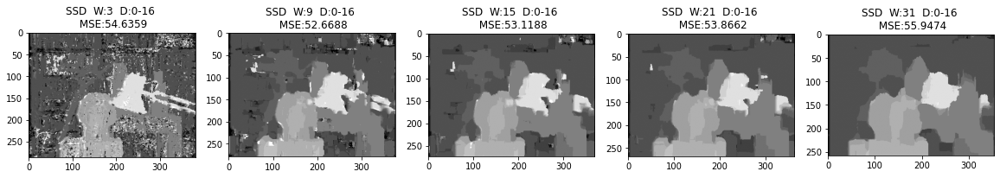

In [ ]:
window_sizes = [3, 9, 15, 21, 31]
matching_costs = ["SSD"]
disparities = [[0, 16]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, folder_name="disparity_map_results")

### Observations
The window size of 3x3 computes better disparities at small parts or detailed parts (e.g., the body of the lamp), while it incorporates a big amount of
noise, resulting in a noisy solution. A bigger window size produces smoother results with more spatial coherence, but does not compute the disparity of small parts correctly.

### **4. Depth map computation with local methods (NCC)**

<span style='color:Green'> - Complete the previous function by adding the implementation of the NCC cost. </span>

<span style='color:Green'>  Evaluate the results changing the window size (e.g. 3x3, 9x9, 21x21,31x31). Comment the results. </span>

In [ ]:
from tqdm import tqdm
from concurrent import futures
import multiprocessing
from joblib import Parallel, delayed
import numpy as np

def ncc_cost(left_patch, right_patch, w):
    """
    Normalized cross correlation between left and right patch, taking into account weight matrix w
    """
    left_patch = left_patch.astype(np.float64)
    right_patch = right_patch.astype(np.float64)
    epsilon = 1e-6
    mean_I1 = np.sum(w*left_patch)
    mean_I2 = np.sum(w*right_patch)
    std_I1 = max(np.sqrt(np.sum(w*(left_patch - mean_I1)**2)), epsilon)
    std_I2 = max(np.sqrt(np.sum(w*(right_patch - mean_I2)**2)), epsilon)
    cost = np.sum(w*(left_patch - mean_I1)*(right_patch - mean_I2)) / (std_I1*std_I2)
    return -cost

matching_costs_dict = {}
matching_costs_dict["SSD"] = ssd_cost
matching_costs_dict["NCC"] = ncc_cost

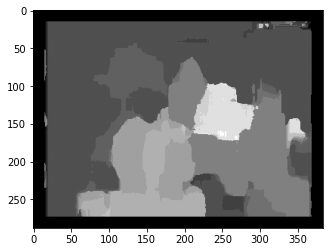

In [ ]:
min_disparity, max_disparity = 0, 16
window_size = 31
matching_cost = "NCC"

disparity_map = stereo_computation(left_img, right_img, min_disparity, \
                                   max_disparity, window_size, matching_cost, create_weight_fn=average_weight, parallelize=True, progress_bar=False)

plt.imshow(disparity_map, cmap='gray')
plt.show()

Let's compare NCC with SSD for different window sizes:

100%|██████████| 5/5 [00:00<00:00, 744.17it/s]
5it [00:00, 87.84it/s]


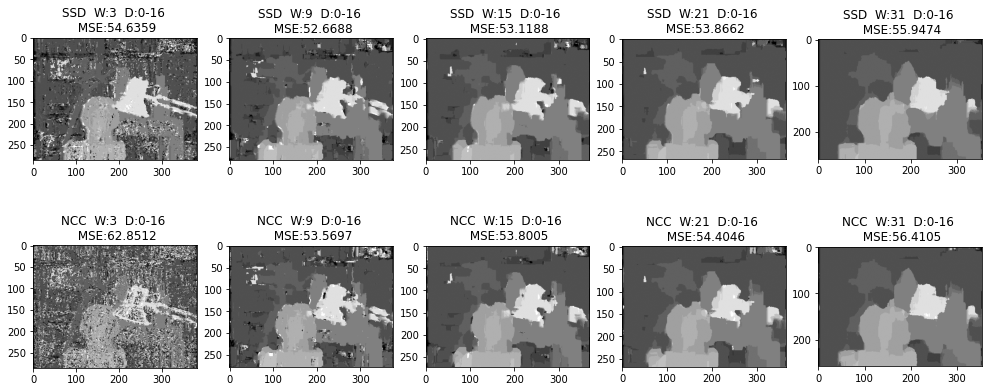

In [ ]:
window_sizes = [3, 9, 15, 21, 31]
matching_costs = ["SSD", "NCC"]
disparities = [[0, 16]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(17, 7), folder_name="disparity_map_results")

### Observations
We can see how we achieve similar results with both methods. NCC at small window size seems very sensitive to noise and at other different sizes the results are comparable, achieving SSD lower MSE.

### **5. Depth map computation with local methods**

Data images: '0001_rectified_s.png','0002_rectified_s.png'

<span style='color:Green'> - Test the functions implemented in the previous section with the facade images. Try different matching costs and window sizes and comment the results. </span>
    
Notice that in this new data the minimum and maximum disparities may change.

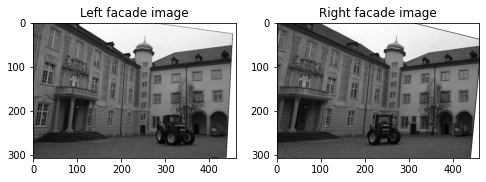

In [ ]:
left_img_facade = cv2.imread("Data/0001_rectified_s.png", 0)
right_img_facade = cv2.imread("Data/0002_rectified_s.png", 0)

# Plot images
fig, ax = plt.subplots(1, 2, figsize=(8, 7))

ax[0].set_title("Left facade image")
ax[0].imshow(left_img_facade, cmap='gray')
ax[1].set_title("Right facade image")
ax[1].imshow(right_img_facade, cmap='gray')

plt.show()

From the two images, we can see that the object with biggest disparity (closest to the camera) is the truck, which moves around 100 pixels. Therefore, we decide to set the maximum disparity to 100.

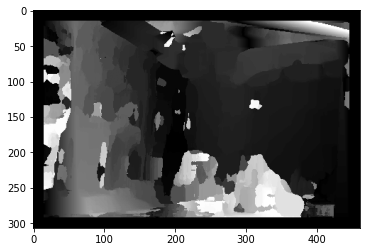

In [ ]:
import cv2
min_disparity, max_disparity = 0, 100
window_size = 31
matching_cost = "SSD"

disparity_map = stereo_computation(left_img_facade, right_img_facade, min_disparity, \
                                   max_disparity, window_size, matching_cost, create_weight_fn=average_weight, parallelize=True, progress_bar=False)

plt.imshow(disparity_map, cmap='gray')
plt.show()

In this case, we cannot compute the MSE as we have no ground truth disparity, but we can visually inspect the results:

100%|██████████| 5/5 [00:00<00:00, 899.72it/s]
5it [00:00, 45.30it/s]


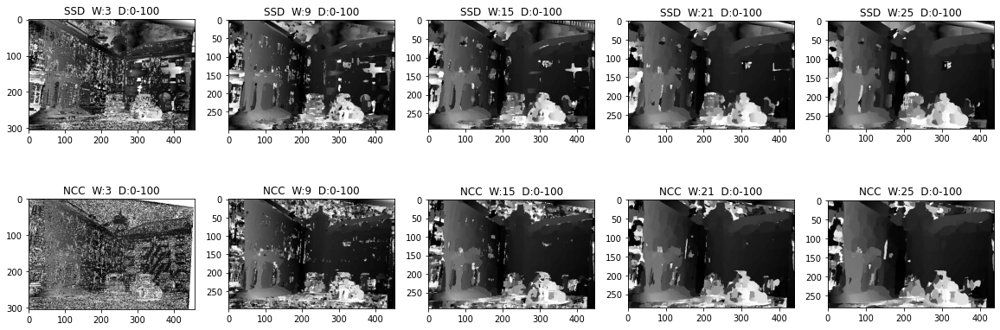

In [ ]:
window_sizes = [3, 9, 15, 21, 25]
matching_costs = ["SSD", "NCC"]
disparities = [[0, 100]]
experiment_name = "facades"
left_img_facade = cv2.imread("Data/0001_rectified_s.png", 0)
right_img_facade = cv2.imread("Data/0002_rectified_s.png", 0)

disp_map_combinations(left_img_facade, right_img_facade, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(None, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(20, 7), folder_name="disparity_map_results")

### Observations
As with the previous set of images, we can see that when using NCC and small window size, the result is very noisy. Small window sizes produce more detailed results, while bigger sizes produce spatially smooth results. When using NCC, we have noticed that the sky disparity is not very smooth, contrary to SSD where at big window sizes, the sky disparity is considerably smooth. This can be due to the fact that we are working with grayscale images and the mean of the patch is substracted in the NCC, it can be easily confused with other smooth areas with different gray intensity level.

### **6. Support Weights**

<span style='color:Green'> - Modify the 'stereo_computation' so that you can use adaptive support weights considering both **proximity** and **similarity**</span>

- Use the original [Exponential](https://ieeexplore.ieee.org/document/1597121#:~:text=Abstract%3A%20We%20present%20a%20new,to%20reduce%20the%20image%20ambiguity.) filters and [Bilateral](https://www.ipol.im/pub/art/2015/123/) Filtering. How are they different?
- How are the support weights adaptive? Plot the support weights for exemplary cases that illustrate the adaptive nature.
- Implement the support weights for color and black and white images. What similarity metric for black and white can you use? 
- Make a small comparison of the effect of the support weights parameters, and compare them to the previous results.
   
Reference paper: Yoon and Kweon, "Adaptive Support-Weight Approach for Correspondence Search", IEEE PAMI 2006

![image](https://user-images.githubusercontent.com/8356912/151323058-04124700-7c77-46bc-8b25-6ac1473300ce.png)


### Implementation of adaptive support weights

In [ ]:
def adaptive_weights(patch, gamma_col, gamma_pos, kind="bilateral"):
    """
    Create adaptive weights of kind bilateral or exponential, based on parameters gamma_col and gamma_pos.
    """
    ps = patch.shape[0]
    w = patch.shape[0]//2
    
    weight_map = np.ones((patch.shape[0], patch.shape[1]))
    patch = patch.astype(np.uint8)
    if kind == "bilateral":
        # Bilateral weights
        if patch.ndim == 3:
            patch_cielab = cv2.cvtColor(patch, cv2.COLOR_RGB2Lab)
            patch_cielab = patch_cielab.astype(np.float64)
            delta_c = (1/3) * np.sum(np.abs(patch - patch[w,w]), axis=2)
        else:
            patch = patch.astype(np.float64)
            delta_c = np.abs(patch - patch[w,w])
    elif kind == "exponential":
        # Exponential weights
        patch = patch.astype(np.float64)
        if patch.ndim == 3:
            delta_c = (1/3) * np.sum((patch - patch[w,w])**2, axis=2)
        else:
            delta_c = (patch - patch[w,w])**2 
    else:
        raise NotImplementedError("You must implement this, don't forget")
    
    xv, yv = np.meshgrid(np.arange(0, ps), np.arange(0, ps))
    delta_g = np.sqrt((xv-xv[w, w])**2 + (yv-yv[w, w])**2)
    
    weight_map = np.exp(-(delta_g/gamma_pos)) * np.exp(-(delta_c/gamma_col)) # delta_c/gamma_col + 
    return weight_map

### Examples of adaptive support weights

[]

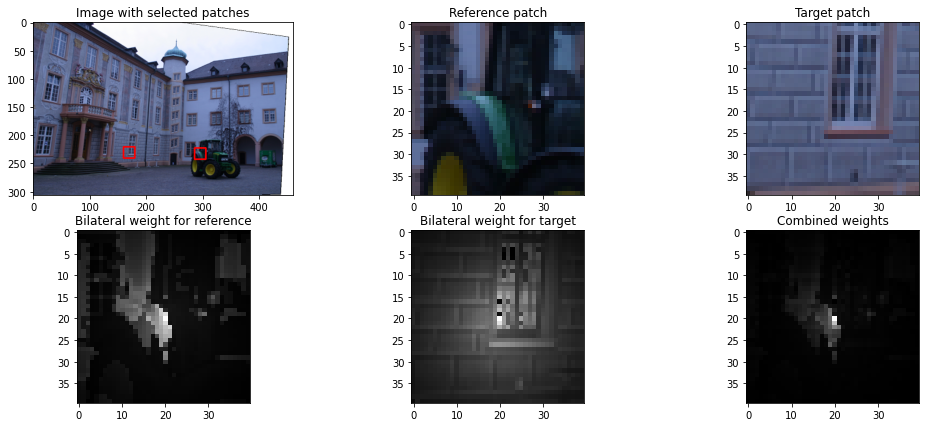

In [ ]:
left_img_facade = cv2.cvtColor(cv2.imread("Data/0001_rectified_s.png"), cv2.COLOR_BGR2RGB)

# Plot images
fig, ax = plt.subplots(2, 3, figsize=(17, 7))

img_with_patches = cv2.rectangle(left_img_facade.copy(), (286, 223), (306, 243), (255,0,0), 2)
img_with_patches = cv2.rectangle(img_with_patches, (160, 221), (180, 241), (255,0,0), 2)

reference_patch = left_img_facade[213:253, 278:318]
target_patch = left_img_facade[211:251, 150:190]

ax[0,0].set_title("Image with selected patches")
ax[0,0].imshow(img_with_patches, cmap='gray')
ax[0,1].set_title("Reference patch")
ax[0,1].imshow(reference_patch, cmap='gray')
ax[0,2].set_title("Target patch")
ax[0,2].imshow(target_patch, cmap='gray')

ref_patch_weights = adaptive_weights(reference_patch, 100, 15, "bilateral")
target_patch_weights = adaptive_weights(target_patch, 100, 15, "bilateral")
target_patch_weights = adaptive_weights(target_patch, 100, 15, "bilateral")
target_patch_weights = target_patch_weights / target_patch_weights.sum()

ax[1,0].set_title("Bilateral weight for reference")
ax[1,0].imshow(ref_patch_weights, cmap='gray')
ax[1,1].set_title("Bilateral weight for target")
ax[1,1].imshow(target_patch_weights, cmap='gray')
ax[1,2].set_title("Combined weights")
ax[1,2].imshow(target_patch_weights*ref_patch_weights, cmap='gray')
plt.plot()

[]

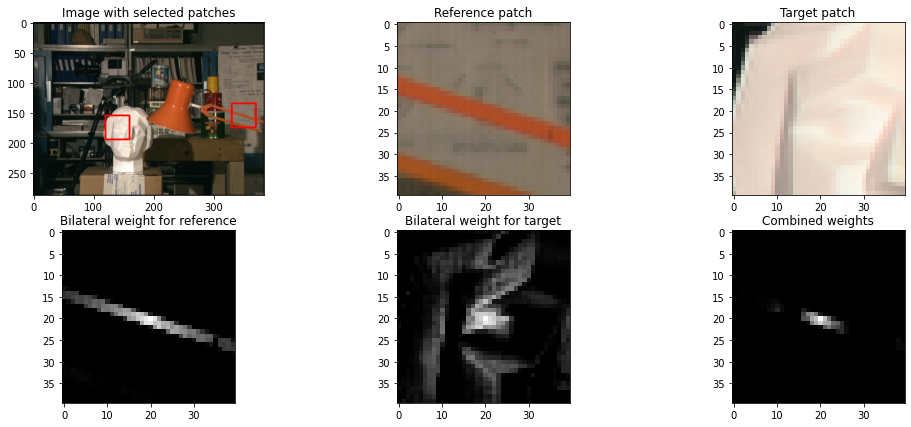

In [ ]:
left_img_middlebury = cv2.cvtColor(cv2.imread("Data/scene1.row3.col3.ppm"), cv2.COLOR_BGR2RGB)

# Plot images
fig, ax = plt.subplots(2, 3, figsize=(17, 7))

img_with_patches = cv2.rectangle(left_img_middlebury.copy(), (330, 135), (370, 175), (255,0,0), 2)
img_with_patches = cv2.rectangle(img_with_patches, (120, 155), (160, 195), (255,0,0), 2)
reference_patch = left_img_middlebury[135:175, 330:370]
target_patch = left_img_middlebury[155:195, 120:160]

ax[0,0].set_title("Image with selected patches")
ax[0,0].imshow(img_with_patches, cmap='gray')
ax[0,1].set_title("Reference patch")
ax[0,1].imshow(reference_patch, cmap='gray')
ax[0,2].set_title("Target patch")
ax[0,2].imshow(target_patch, cmap='gray')

ref_patch_weights = adaptive_weights(reference_patch, 100, 15, "exponential")
target_patch_weights = adaptive_weights(target_patch, 100, 15, "exponential")

ax[1,0].set_title("Bilateral weight for reference")
ax[1,0].imshow(ref_patch_weights, cmap='gray')
ax[1,1].set_title("Bilateral weight for target")
ax[1,1].imshow(target_patch_weights, cmap='gray')
ax[1,2].set_title("Combined weights")
ax[1,2].imshow(target_patch_weights*ref_patch_weights, cmap='gray')
plt.plot()

[]

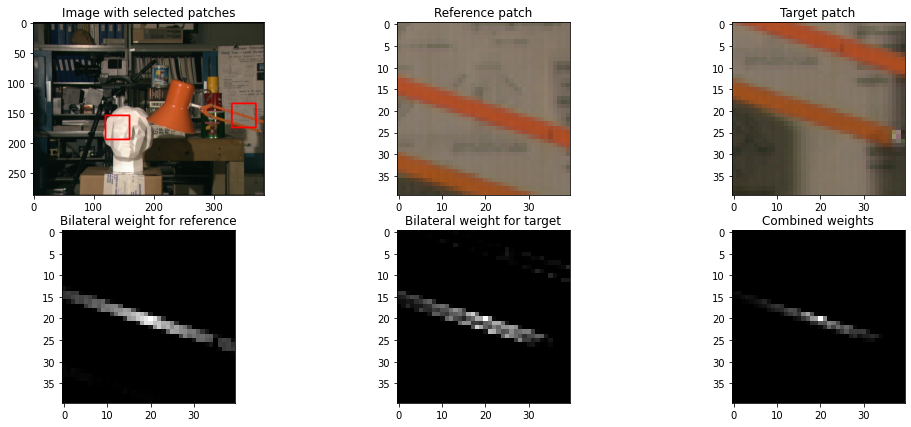

In [ ]:
left_img_middlebury = cv2.cvtColor(cv2.imread("Data/scene1.row3.col3.ppm"), cv2.COLOR_BGR2RGB)

# Plot images
fig, ax = plt.subplots(2, 3, figsize=(17, 7))

img_with_patches = cv2.rectangle(left_img_middlebury.copy(), (330, 135), (370, 175), (255,0,0), 2)
img_with_patches = cv2.rectangle(img_with_patches, (120, 155), (160, 195), (255,0,0), 2)
reference_patch = left_img_middlebury[135:175, 330:370]
target_patch = left_img_middlebury[155:195, 340:380]

ax[0,0].set_title("Image with selected patches")
ax[0,0].imshow(img_with_patches, cmap='gray')
ax[0,1].set_title("Reference patch")
ax[0,1].imshow(reference_patch, cmap='gray')
ax[0,2].set_title("Target patch")
ax[0,2].imshow(target_patch, cmap='gray')

ref_patch_weights = adaptive_weights(reference_patch, 100, 15, "exponential")
target_patch_weights = adaptive_weights(target_patch, 100, 15, "exponential")

ax[1,0].set_title("Bilateral weight for reference")
ax[1,0].imshow(ref_patch_weights, cmap='gray')
ax[1,1].set_title("Bilateral weight for target")
ax[1,1].imshow(target_patch_weights, cmap='gray')
ax[1,2].set_title("Combined weights")
ax[1,2].imshow(target_patch_weights*ref_patch_weights, cmap='gray')
plt.plot()

[]

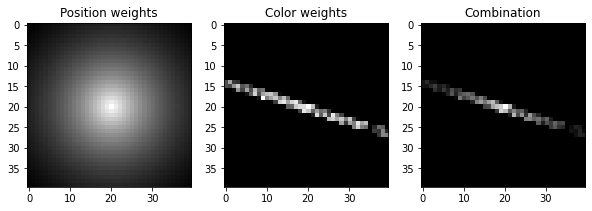

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(10, 5))

ref_patch_weights_position = adaptive_weights(reference_patch, 100000000, 15, "exponential")
ref_patch_weights_color = adaptive_weights(reference_patch, 20, 10000000, "exponential")
ref_patch_weights_combined = adaptive_weights(reference_patch, 20, 15, "exponential")

ax[0].set_title("Position weights")
ax[0].imshow(ref_patch_weights_position, cmap='gray')
ax[1].set_title("Color weights")
ax[1].imshow(ref_patch_weights_color, cmap='gray')
ax[2].set_title("Combination")
ax[2].imshow(ref_patch_weights_combined, cmap='gray')

plt.plot()

### Support weights for color and grayscale images 

In [ ]:
from functools import partial


def adaptive_weight_cost(left_patch, right_patch, w, gammac, gammap_mult, diff_type="l1", kind="bilateral"):
    """
    Apply a local matching cost (l1 / l2) using adaptive support weights
    """
    gammap = left_patch.shape[0]//2 * gammap_mult

    w1 = adaptive_weights(left_patch, gammac, gammap, kind=kind)
    w2 = adaptive_weights(right_patch, gammac, gammap, kind=kind)
    
    left_patch, right_patch = left_patch.astype(np.float64), right_patch.astype(np.float64)
    if diff_type == "l1":
        if left_patch.ndim == 3:
            diff = np.sum(np.abs(left_patch-right_patch), axis=2)
        else:
            diff = np.abs(left_patch-right_patch)
            
    elif diff_type == "l2":
        if left_patch.ndim == 3:
            diff = np.sum((left_patch-right_patch)**2, axis=2)
        else:
            diff = (left_patch-right_patch)**2

    else:
        raise NotImplementedError("Metric "+diff_type+" not implemented")
        
    res = np.sum(w1*w2*diff) / np.sum(w1*w2)
            
    return res

window_size = 31
bil_weights = partial(adaptive_weights, gamma_col=12, gamma_pos=window_size//2)

window_size = 31
gamma_p_mult = 1
matching_costs_dict["SSD-BILATERAL"] = partial(adaptive_weight_cost, gammac=12, gammap_mult=gamma_p_mult, diff_type="l2", kind="bilateral")
matching_costs_dict["L1-BILATERAL"] = partial(adaptive_weight_cost, gammac=12, gammap_mult=gamma_p_mult, diff_type="l1", kind="bilateral")
matching_costs_dict["SSD-EXPONENTIAL"] = partial(adaptive_weight_cost, gammac=12,gammap_mult=gamma_p_mult, diff_type="l2", kind="exponential")
matching_costs_dict["L1-EXPONENTIAL"] = partial(adaptive_weight_cost, gammac=12, gammap_mult=gamma_p_mult, diff_type="l1", kind="exponential")

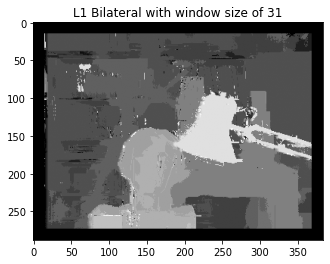

In [ ]:
from functools import partial

window_size=31
min_disparity, max_disparity = 0, 16

matching_cost = "L1-BILATERAL"

disparity_map = stereo_computation(left_img, right_img, min_disparity, \
                                   max_disparity, window_size, matching_cost, matching_cost=matching_cost, create_weight_fn=bil_weights, parallelize=True, progress_bar=False)

plt.imshow(disparity_map, cmap='gray')
plt.title("L1 Bilateral with window size of 31")
plt.show()

100%|██████████| 4/4 [00:00<00:00, 529.37it/s]
4it [00:00, 60.47it/s]


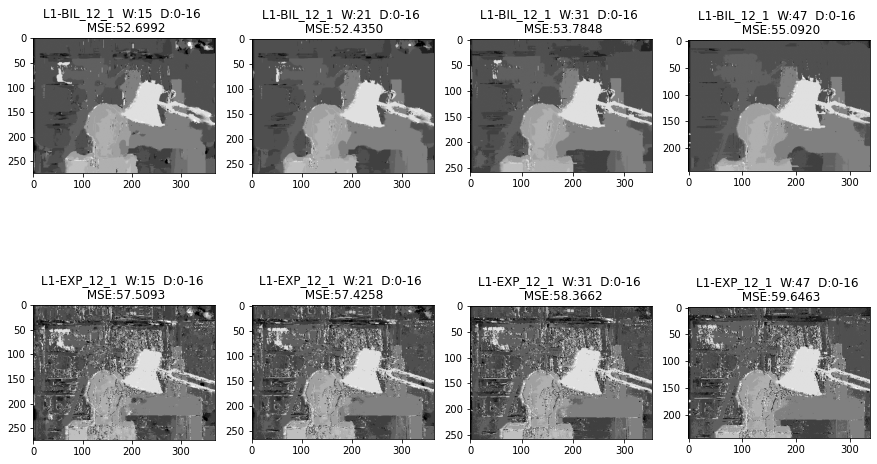

In [ ]:
from functools import partial

window_sizes = [15, 21, 31, 47]
matching_costs_dict["L1-BIL_12_1"] = partial(adaptive_weight_cost, gammac=12,gammap_mult=1, diff_type="l1", kind="bilateral")
matching_costs_dict["L1-EXP_12_1"] = partial(adaptive_weight_cost, gammac=12,gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs = ["L1-BIL_12_1", "L1-EXP_12_1"]
disparities = [[0, 16]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(15, 9), folder_name="disparity_map_results")

100%|██████████| 4/4 [00:00<00:00, 423.34it/s]
4it [00:00, 49.99it/s]


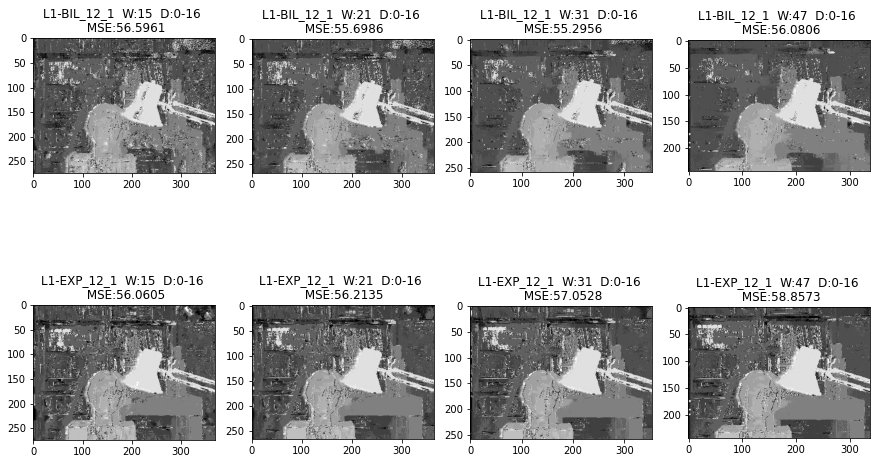

In [ ]:
from functools import partial

window_sizes = [15, 21, 31, 47]
matching_costs_dict["L1-BIL_12_1"] = partial(adaptive_weight_cost, gammac=12,gammap_mult=1, diff_type="l1", kind="bilateral")
matching_costs_dict["L1-EXP_12_1"] = partial(adaptive_weight_cost, gammac=12,gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs = ["L1-BIL_12_1", "L1-EXP_12_1"]
disparities = [[0, 16]]
experiment_name = "scene1_color"

left_color_img, right_color_img = cv2.imread("Data/scene1.row3.col3.ppm"), cv2.imread("Data/scene1.row3.col4.ppm")

disp_map_combinations(left_color_img, right_color_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(15, 9), folder_name="disparity_map_results")

### Comparison with approaches of previous sections (SSD and NCC)
##### SSD / NCC / Adaptive support weights with L2 / L1

100%|██████████| 5/5 [00:00<00:00, 105.42it/s]
5it [00:00, 18.43it/s]


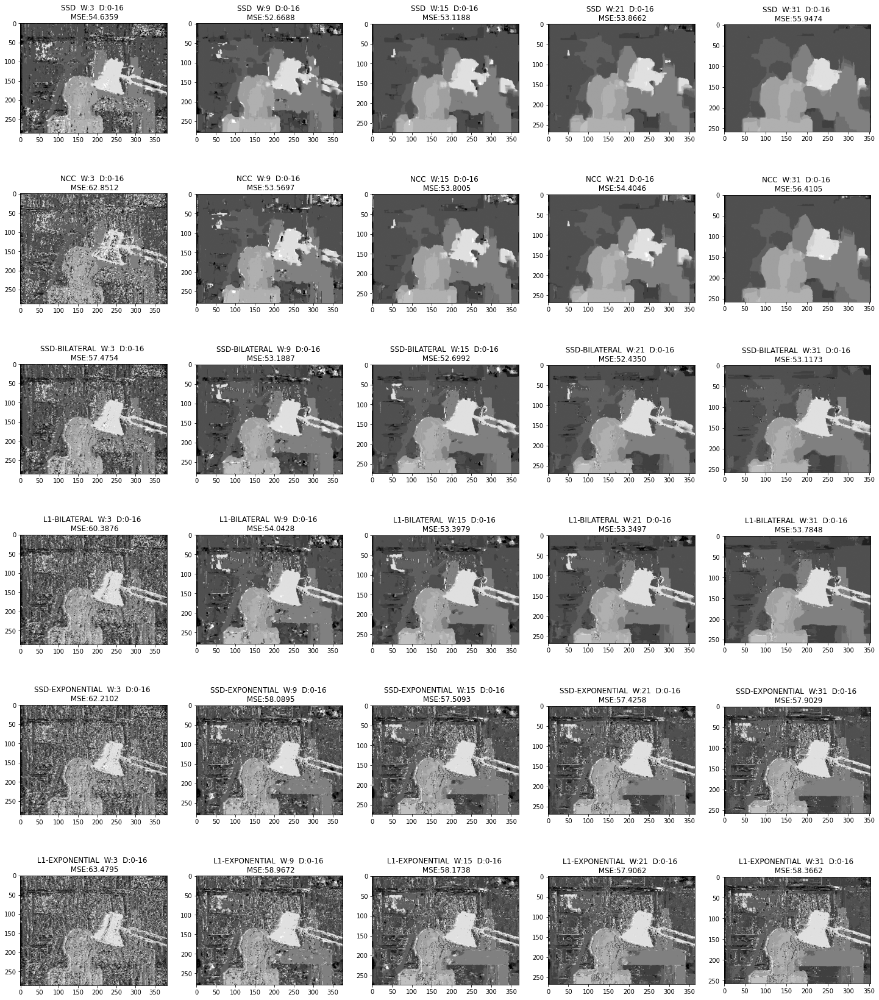

In [ ]:
window_sizes = [3, 9, 15, 21, 31]
matching_costs = ["SSD", "NCC", "SSD-BILATERAL", "L1-BILATERAL", "SSD-EXPONENTIAL", "L1-EXPONENTIAL"]
disparities = [[0, 16]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(25, 30), folder_name="disparity_map_results")

##### Changing parameters of $\gamma_{pos}$ and $\gamma_{col}$ of adaptive support weights (Bilateral and Exponential)

In [ ]:
# Define different costs with different set of parameters
matching_costs_dict["L1-BIL_12_4"] = partial(adaptive_weight_cost, gammac=12, gammap_mult=4, diff_type="l1", kind="bilateral")
matching_costs_dict["L1-BIL_12_2"] = partial(adaptive_weight_cost, gammac=12, gammap_mult=2, diff_type="l1", kind="bilateral")
matching_costs_dict["L1-BIL_12_1"] = partial(adaptive_weight_cost, gammac=12,gammap_mult=1, diff_type="l1", kind="bilateral")
matching_costs_dict["L1-BIL_25_1"] = partial(adaptive_weight_cost, gammac=25, gammap_mult=1, diff_type="l1", kind="bilateral")
matching_costs_dict["L1-BIL_50_1"] = partial(adaptive_weight_cost, gammac=50, gammap_mult=1, diff_type="l1", kind="bilateral")
matching_costs_dict["L1-BIL_100_1"] = partial(adaptive_weight_cost, gammac=100, gammap_mult=1, diff_type="l1", kind="bilateral")

matching_costs_dict["L1-EXP_12_4"] = partial(adaptive_weight_cost, gammac=12, gammap_mult=4, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_12_2"] = partial(adaptive_weight_cost, gammac=12, gammap_mult=2, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_12_1"] = partial(adaptive_weight_cost, gammac=12,gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_25_1"] = partial(adaptive_weight_cost, gammac=25, gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_50_1"] = partial(adaptive_weight_cost, gammac=50, gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_100_1"] = partial(adaptive_weight_cost, gammac=100, gammap_mult=1, diff_type="l1", kind="exponential")

Changing parameters with bilateral weights:

100%|██████████| 2/2 [00:00<00:00, 83.62it/s]
2it [00:00, 23.45it/s]


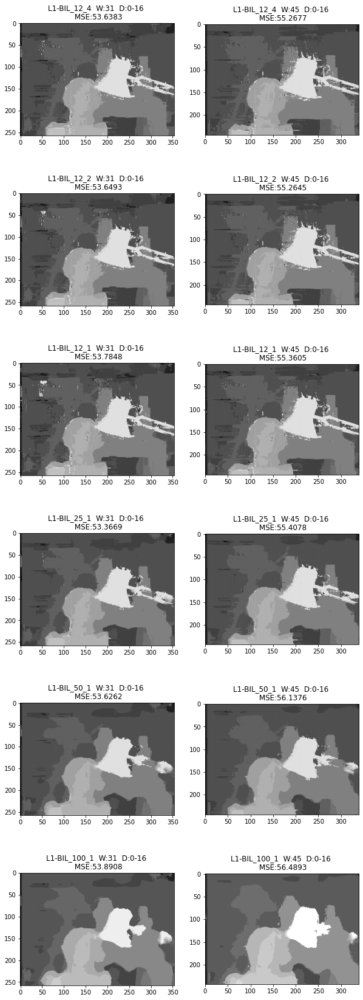

In [ ]:
window_sizes = [31, 45]
matching_costs = ["L1-BIL_12_4", "L1-BIL_12_2", "L1-BIL_12_1", "L1-BIL_25_1", "L1-BIL_50_1", "L1-BIL_100_1"]
disparities = [[0, 16]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(10, 30), folder_name="disparity_map_results")

Changing parameters with exponential weights:

In [ ]:
matching_costs_dict["L1-EXP_100_1"] = partial(adaptive_weight_cost, gammac=100, gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_100_1"] = partial(adaptive_weight_cost, gammac=100, gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_150_1"] = partial(adaptive_weight_cost, gammac=150, gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_200_1"] = partial(adaptive_weight_cost, gammac=200, gammap_mult=1, diff_type="l1", kind="exponential")
matching_costs_dict["L1-EXP_250_1"] = partial(adaptive_weight_cost, gammac=250, gammap_mult=1, diff_type="l1", kind="exponential")

100%|██████████| 2/2 [00:00<00:00, 248.24it/s]
2it [00:00, 31.96it/s]


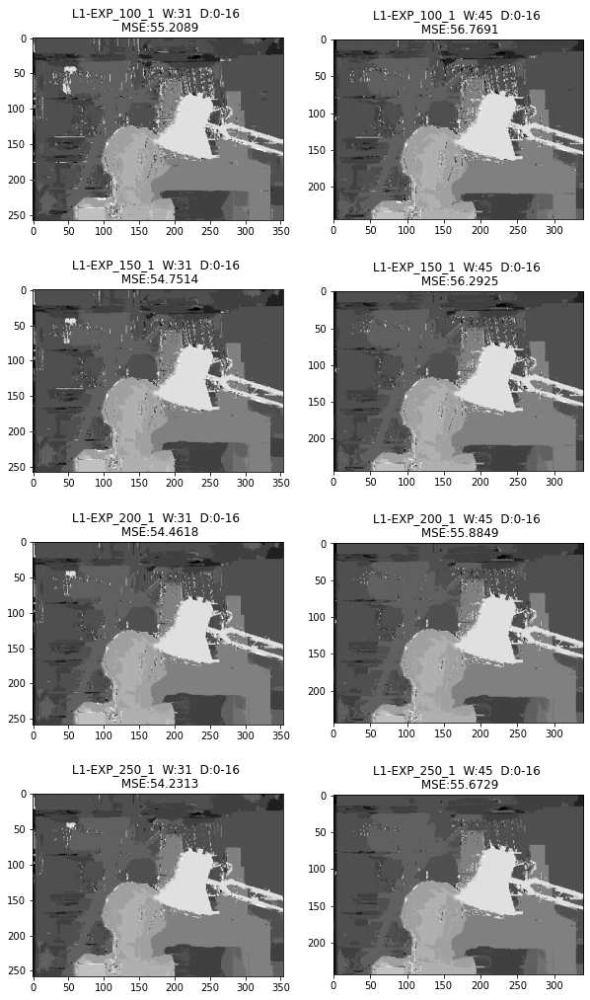

In [ ]:
window_sizes = [31, 45]
matching_costs = ["L1-EXP_100_1", "L1-EXP_150_1", "L1-EXP_200_1", "L1-EXP_250_1"]
disparities = [[0, 16]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(10, 18), folder_name="disparity_map_results")

100%|██████████| 5/5 [00:00<00:00, 2325.26it/s]
5it [00:00, 135.74it/s]


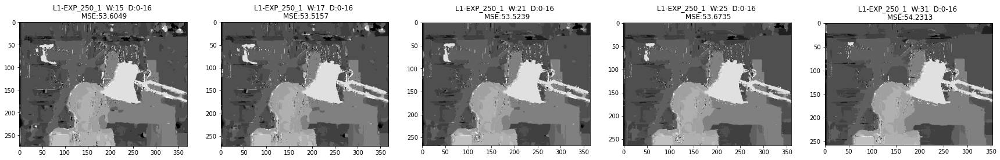

In [ ]:
window_sizes = [15, 17, 21, 25, 31]
matching_costs = ["L1-EXP_250_1"]
disparities = [[0, 16]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(30, 80), folder_name="disparity_map_results")

We can see that bilateral weights have achieved lower MSE than exponential weights in our experiments. What is more, as mentioned by the authors of bilateral weights, bilateral weights recover depth discontinuities better.

Now, we select the current best combination of parameters which are L1 distance with bilateral weights and try different window sizes to minimize the MSE as much as possible:

100%|██████████| 5/5 [00:00<00:00, 2135.59it/s]
5it [00:00, 123.93it/s]


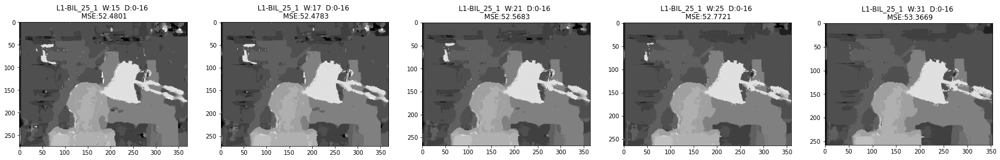

In [ ]:
window_sizes = [15, 17, 21, 25, 31]
matching_costs = ["L1-BIL_25_1"]
disparities = [[0, 16]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(30, 80), folder_name="disparity_map_results")

Now, we try to set the maximum disparity to 28, which by looking at the groundtruth values is the maximum.

100%|██████████| 5/5 [00:00<00:00, 963.28it/s]
5it [00:00, 133.44it/s]


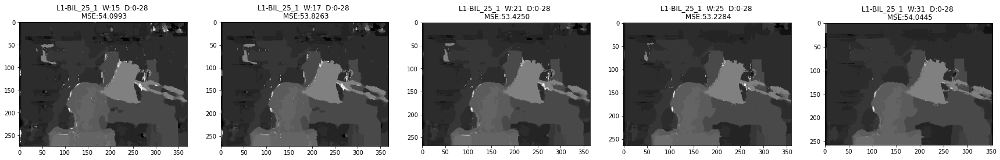

In [ ]:
window_sizes = [15, 17, 21, 25, 31]
matching_costs = ["L1-BIL_25_1"]
disparities = [[0, 28]]
experiment_name = "scene1"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(30, 80), folder_name="disparity_map_results")

By changing the disparity to this new value, we don't obtain better results.

# OPTIONAL:  Depth computation with Plane Sweeping

<span style='color:Green'>  Implement the plane sweeping method explained in class. You can implemented naively or with the computational efficiency details explained on the paper</span>
 
 "Given a plane in space, it is possible to project both images onto
it using projective texture mapping. If the plane is located
at the same depth as the recorded scene, pixels from both
images should be consistent." [Multi-Resolution Real-Time Stereo on Commodity Graphics Hardware](https://people.inf.ethz.ch/pomarc/pubs/YangCVPR03.pdf)

- Be clear about what information from the cameras and scene is required
- Implement the algorithm for two Cameras. Test it on the Middlebury images. Compare quantitatively this method and the previously developed ones for depth estimates with respect to the ground truth depth.
- What changes you will have to make to process unrectified images? No need to implement them.

In [ ]:
!pip install scikit-image

     |████████████████████████████████| 13.3 MB 26.7 MB/s 
     |████████████████████████████████| 6.1 MB 14.5 MB/s 
     |████████████████████████████████| 1.9 MB 14.4 MB/s 
     |████████████████████████████████| 178 kB 30.5 MB/s 
     |████████████████████████████████| 3.3 MB 44.8 MB/s 
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


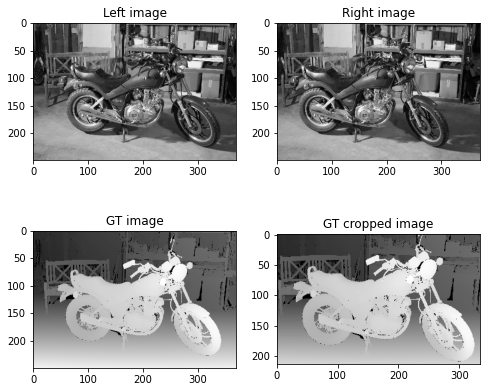

In [ ]:
import cv2
import matplotlib.pyplot as plt
import imageio
imageio.plugins.freeimage.download()
# Read input images
left_img = cv2.imread("Data/im0.png", 0)
left_img = cv2.resize(left_img, (left_img.shape[1]//8, left_img.shape[0]//8))
right_img = cv2.imread("Data/im1.png", 0)
right_img = cv2.resize(right_img, (right_img.shape[1]//8, right_img.shape[0]//8))

disparity_gt = imageio.imread("Data/disp0_2.pfm")
disparity_gt = np.fliplr(np.flip(disparity_gt))
disparity_gt[disparity_gt==np.inf] = 0
disparity_gt = cv2.resize(disparity_gt, (left_img.shape[1], left_img.shape[0]))
disparity_gt /= 8

# Plot images
fig, ax = plt.subplots(2, 2, figsize=(8, 7))

# Ground-truth images have padding of 18 pixels: https://vision.middlebury.edu/stereo/taxonomy-IJCV.pdf
gt_cropped = disparity_gt[18:-18, 18:-18]

ax[0,0].set_title("Left image")
ax[0,0].imshow(left_img, cmap='gray')
ax[0,1].set_title("Right image")
ax[0,1].imshow(right_img, cmap='gray')
ax[1,0].set_title("GT image")
ax[1,0].imshow(disparity_gt, cmap='gray')
ax[1,1].set_title("GT cropped image")
ax[1,1].imshow(gt_cropped, cmap='gray')

plt.show()

We first use the previous local matching methods to have a baseline to compare to.

100%|██████████| 5/5 [00:00<00:00, 772.72it/s]
5it [00:00, 56.64it/s]


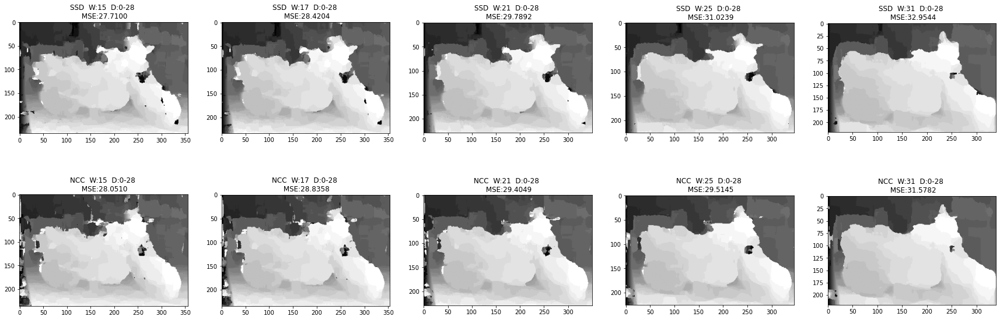

In [ ]:
window_sizes = [15, 17, 21, 25, 31]
matching_costs = ["SSD", "NCC"]
disparities = [[0, 28]]
experiment_name = "scene2"

disp_map_combinations(left_img, right_img, matching_costs, window_sizes, \
                       disparities, experiment_name)
show_disp_maps(disparity_gt, matching_costs, window_sizes, disparities[0], \
                experiment_name, fig_size=(30, 10), folder_name="disparity_map_results")

For the sweep plane algorithm we need the intrinsic camera matrices and the baseline in the case of a stereo rectified setting.

In [ ]:
import math
from scipy.ndimage import map_coordinates
from joblib import Parallel, delayed

def get_transformed_pixels_coords(I, H, shift=None):
    ys, xs = np.indices(I.shape[:2]).astype("float64")
    if shift is not None:
        ys += shift[1]
        xs += shift[0]
    ones = np.ones(I.shape[:2])
    coords = np.stack((xs, ys, ones), axis=2)
    coords_H = (H @ coords.reshape(-1, 3).T).T
    coords_H /= coords_H[:, 2, np.newaxis]
    cart_H = coords_H[:, :2]
    
    return cart_H.reshape((*I.shape[:2], 2))

def compute_homography(depth, P1, P2):
  plane_t = P1[2, :]-np.array([0, 0, 0, depth])
  A = np.linalg.inv(np.vstack([P1, plane_t]))[:, :-1]
  H = P2 @ A[:, :3]
  return H

def apply_H_fixed_image_size(I, H, corners):
    h, w = I.shape[:2] # when we convert to np.array it swaps
    
    # corners
    c1 = np.array([1, 1, 1])
    c2 = np.array([w, 1, 1])
    c3 = np.array([1, h, 1])
    c4 = np.array([w, h, 1])
    
    # transformed corners
    Hc1 = H @ c1
    Hc2 = H @ c2
    Hc3 = H @ c3
    Hc4 = H @ c4
    Hc1 = Hc1 / Hc1[2]
    Hc2 = Hc2 / Hc2[2]
    Hc3 = Hc3 / Hc3[2]
    Hc4 = Hc4 / Hc4[2]
    
    xmin = corners[0]
    xmax = corners[1]
    ymin = corners[2]
    ymax = corners[3]

    size_x = math.ceil(xmax - xmin + 1)
    size_y = math.ceil(ymax - ymin + 1)
    
    # transform image
    H_inv = np.linalg.inv(H)
    
    out = np.zeros((size_y, size_x))
    shift = (xmin, ymin)
    interpolation_coords = get_transformed_pixels_coords(out, H_inv, shift=shift)
    interpolation_coords[:, :, [0, 1]] = interpolation_coords[:, :, [1, 0]]
    interpolation_coords = np.swapaxes(np.swapaxes(interpolation_coords, 0, 2), 1, 2)
    
    out = map_coordinates(I, interpolation_coords)
    
    return out.astype("uint8")

def Normalise_last_coord(x):
    xn = x  / x[2,:]
    
    return xn


In [ ]:
def ssd_cost(left_patch, right_patch, w):
  left_patch = left_patch.astype(np.float64)
  right_patch = right_patch.astype(np.float64)
  w = w.astype(np.float64)
  cost = np.sum(w*(left_patch - right_patch)**2)
  return cost

def compute_similarity(img1, img2, w_size, matching_cost):
  # Using integral image would be much faster
  diff_map = np.zeros_like(img1).astype(np.float64)
  padding = w_size // 2
  h, w = img1.shape[0], img1.shape[1]

  weight_map = np.ones((w_size, w_size)).astype(np.float64)
  weight_map = weight_map / weight_map.sum()

  for i in range(padding, h-padding):
    for j in range(padding, w-padding):
      patch1 = img1[i - padding:i + padding + 1, \
                            j - padding:j + padding + 1].astype(np.float64)
      patch2 = img2[i - padding:i + padding + 1, \
                              j - padding:j + padding + 1].astype(np.float64)
      
      cost = matching_costs_dict[matching_cost](patch1, patch2, weight_map)

      diff_map[i, j] = cost
  return diff_map

def plane_sweep_at_depth_d(img1, img2, P1, P2, depth, w_size, matching_cost):
    H = compute_homography(depth, P1, P2)
    img2_prime = apply_H_fixed_image_size(img1, H, corners=[0, img2.shape[1]-1, 0, img2.shape[0]-1])
    similarity = compute_similarity(img2_prime, img2, w_size, matching_cost)
    similarity.reshape(1, similarity.shape[0], similarity.shape[1])
    return similarity, img2_prime
    
def plane_sweep(img1, img2, P1, P2, depth_step, n_depths, w_size, matching_cost, start_depth=30000):
  similarities = []
  results = Parallel(n_jobs=16, verbose=10)(delayed(plane_sweep_at_depth_d)(img1, img2, P1, P2, start_depth+n_depth*depth_step, w_size, matching_cost) for n_depth in range(1, n_depths+1))

  depth_map = np.full(img1.shape, 0, dtype=np.float64)
  diff_map = np.full(img1.shape, np.inf, dtype=np.float64)
  for i, res in enumerate(results):
      res_sim, _ = res
      merged_disp = cv2.merge([_.astype(np.uint8), img2.astype(np.uint8), img2.astype(np.uint8)])
      
      depth = (i+1)*depth_step+start_depth
      depth_map[res_sim < diff_map] = (i+1)*depth_step+start_depth
      diff_map = np.minimum(res_sim, diff_map)

  return depth_map


In [ ]:
import os

def compute_mse(x1, x2):
  # Relative disparities, as gt uses random disparities
  return np.sum((x1-x2)**2) / (x1.shape[0]*x1.shape[1])

def sweep_plane_combinations(left_img, right_img, matching_costs, window_sizes, P1, P2, step_size, num_steps, experiment_name, f, baseline, folder_name="plane_sweep_results"):
    img1, img2 = left_img, right_img
    
    if not os.path.exists(os.path.join("Data", folder_name)):
      os.mkdir(os.path.join("Data", folder_name))
    if not os.path.exists(os.path.join("Data", folder_name, experiment_name)):
      os.mkdir(os.path.join("Data", folder_name, experiment_name))
    
    for w_size in tqdm(window_sizes):
        for matching_cost in matching_costs:
            img_path = os.path.join("Data", folder_name, experiment_name, \
                                    str(w_size)+"_"+str(matching_cost)+"_"+str(num_steps)+"_"+str(step_size)+".png")

            # If experiment has been already done, do not continue
            if not os.path.exists(img_path):
                depth_map = plane_sweep(img1, img2, P1, P2, step_size, num_steps, w_size, matching_cost)
                # Crop disparity map
                disp_map = baseline * (f / depth_map)
                disp_map = disp_map[w_size//2:disp_map.shape[0]-w_size//2, w_size//2:disp_map.shape[1]-w_size//2]
                cv2.imwrite(img_path, disp_map)
            
def show_plane_sweeps(gt, matching_costs, window_sizes, step_size, num_steps, experiment_name, folder_name="plane_sweep_results"):
    fig, ax = plt.subplots(len(matching_costs), len(window_sizes), figsize=(20, 10))
    
    for i, w_size in tqdm(enumerate(window_sizes)):
        for j, matching_cost in enumerate(matching_costs):

            img_path = os.path.join("Data", folder_name, experiment_name, \
                                    str(w_size)+"_"+str(matching_cost)+"_"+str(num_steps)+"_"+str(step_size)+".png")
            if not os.path.exists(img_path):
                print("Image "+ path+ " does not exist")
                return

            depth_map = cv2.imread(img_path, 0) 
            depth_map_show = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())
            rows = depth_map.shape[0]
            
            if type(gt) == np.ndarray:
              pad_rm = w_size//2
              gt_tmp = gt[pad_rm:-pad_rm, pad_rm:-pad_rm]
              mse = compute_mse(gt_tmp.astype(np.float32), depth_map) 

            str_title = matching_costs[j] + "  W:" + str(w_size)
            if type(gt) == np.ndarray:
              str_mse = "{:.4f}".format(mse)
              str_title += " \n MSE:"+str_mse

            if len(matching_costs) > 1:
              ax[j,i].set_title(str_title)
              ax[j,i].imshow(depth_map_show, cmap='gray')
            else:
              ax[i].set_title(str_title)
              ax[i].imshow(depth_map_show, cmap='gray')
    fig.tight_layout()
    plt.savefig("Data/last_figure.pdf")

100%|██████████| 6/6 [00:00<00:00, 208.49it/s]
6it [00:00, 98.82it/s]


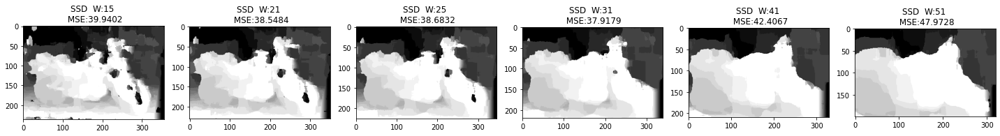

In [ ]:
window_sizes = [15, 21, 25, 31, 41, 51]
matching_costs = ["SSD"]
num_steps = 100
step_size = 1000
experiment_name = "motorbike2"

baseline=193.001
f = 3997.684

K1 = np.array([
    [3997.684, 0, 1176.728],
    [0, 3997.684, 1011.728],
    [0, 0, 1]
])

K2 = np.array([
    [3997.684, 0, 1176.728],
    [0, 3997.684, 1011.728],
    [0, 0, 1]
])

P1 = K1 @ np.array([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 1, 0]
])

P2 = K2 @ np.array([
    [1, 0, 0, -baseline],
    [0, 1, 0, 0],
    [0, 0, 1, 0]
])

sweep_plane_combinations(left_img, right_img, matching_costs, window_sizes, P1, P2, step_size, num_steps, experiment_name, f, baseline)
show_plane_sweeps(disparity_gt, matching_costs, window_sizes, step_size, num_steps, experiment_name)

We can see that in this case the plane sweep algorithm gives worse MSE compared to previous methods with the parameters that were tested.

# OPTIONAL:  New view synthesis Rectified Images

In this task you are asked to implement part of the new view synthesis method presented in the following paper: S. Seitz, and C. Dyer, View morphing, Proc. ACM SIGGRAPH 1996.

You will use a pair of rectified stereo images (no need for prewarping and postwarping stages) and their corresponding ground truth disparities (folder "new_view"). Remember to take into account occlusions as explained in the lab session. Once done you can apply the code to the another pair of rectified images provided in the material and use the estimated disparities with previous methods.
![image.png](attachment:image.png)
![new_views_morph](https://user-images.githubusercontent.com/8356912/151237907-8944e3d2-f84d-4707-a63c-357f005b4823.gif)


In [ ]:
!pip install imageio==2.14.1

     |████████████████████████████████| 3.3 MB 18.0 MB/s 
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

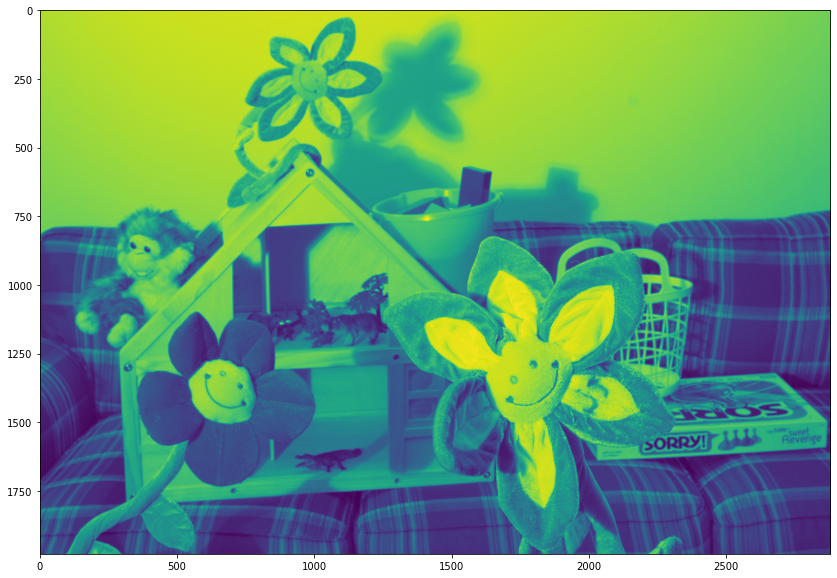

In [ ]:
img0=cv2.imread('Data/new_view/im0.png',0)
img1=cv2.imread('Data/new_view/im1.png',0)
plt.imshow(img0)
plt.show()

Imageio: 'libfreeimage-3.16.0-linux64.so' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-linux64.so (4.6 MB)
Downloading: 8192/4830080 bytes (0.2%4830080/4830080 bytes (100.0%)
  Done
File saved as /root/.imageio/freeimage/libfreeimage-3.16.0-linux64.so.


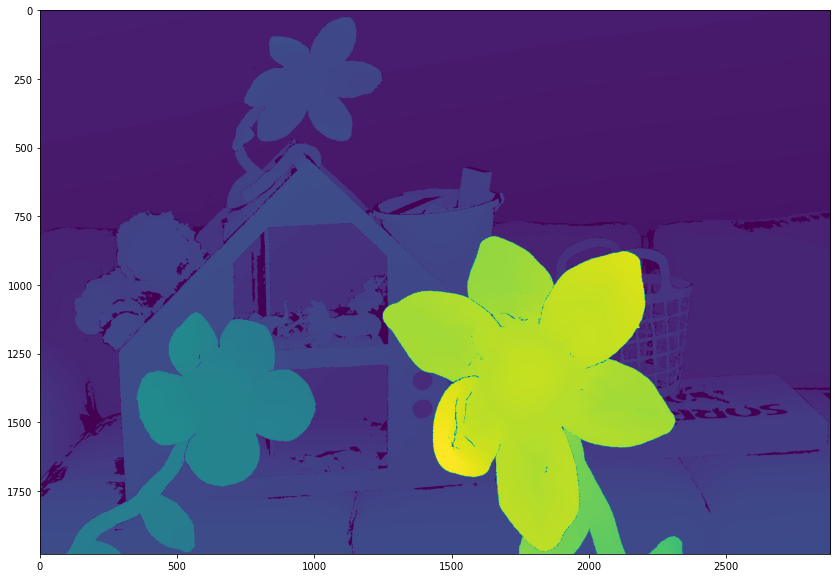

Array([  0.   ,  31.007,  31.5  , ..., 604.663, 604.663, 604.663],
      dtype=float32)

In [ ]:
import imageio
imageio.plugins.freeimage.download()
disp0 = imageio.imread('Data/new_view/disp0.pfm')
disp0 = np.fliplr(np.flip(disp0))
disp0[disp0==np.inf] = 0

disp1 = imageio.imread('Data/new_view/disp1.pfm')
disp1 = np.fliplr(np.flip(disp1))
disp1[disp1==np.inf] = 0

plt.imshow(disp0)
plt.show()
np.unique(disp0)

In [ ]:
print(disp0.shape)
s=0.5
new_image = np.zeros((1980,2880,2))
# new_image = img1.copy()
print(new_image.shape)

for y in range(new_image.shape[0]):
    for x in range(new_image.shape[1]):
        z = int(disp0[y][x])
        to_add = int(s*z)
#         if x+to_add > new_image.shape[0] or x+z > new_image.shape[0]:
#             continue
        try:
            new_index = int((1-s)*x+s*(x+z))
            if new_image[y][new_index][1]!=0:
                if new_image[y][new_index][1]<z:
                    new_image[y][new_index][0] = (1-s)*img0[y][x] + s*img1[y][x+z]
                    new_image[y][new_index][1] = z
                    continue
            else:
                new_image[y][new_index][0] = (1-s)*img0[y][x] + s*img1[y][x+z]
                new_image[y][new_index][1] = z
        except(IndexError):
            if y % 100 ==0:  
                print(x,y,z, to_add,x+z)
            pass

2872 700 35 17 2907
2873 700 35 17 2908
2874 700 35 17 2909
2875 700 35 17 2910
2876 700 35 17 2911
2877 700 35 17 2912
2878 700 35 17 2913
2879 700 35 17 2914
2821 800 59 29 2880
2822 800 59 29 2881
2823 800 59 29 2882
2824 800 59 29 2883
2825 800 59 29 2884
2826 800 59 29 2885
2827 800 59 29 2886
2828 800 59 29 2887
2829 800 59 29 2888
2830 800 59 29 2889
2831 800 59 29 2890
2832 800 59 29 2891
2833 800 59 29 2892
2834 800 59 29 2893
2835 800 59 29 2894
2836 800 59 29 2895
2837 800 59 29 2896
2838 800 59 29 2897
2839 800 59 29 2898
2840 800 59 29 2899
2841 800 59 29 2900
2842 800 59 29 2901
2843 800 59 29 2902
2844 800 59 29 2903
2845 800 59 29 2904
2846 800 59 29 2905
2847 800 59 29 2906
2848 800 59 29 2907
2849 800 59 29 2908
2850 800 59 29 2909
2851 800 59 29 2910
2852 800 59 29 2911
2853 800 59 29 2912
2854 800 59 29 2913
2855 800 59 29 2914
2856 800 59 29 2915
2857 800 59 29 2916
2858 800 59 29 2917
2859 800 59 29 2918
2860 800 59 29 2919
2861 800 59 29 2920
2862 800 59 29 2921


(1980, 2880, 2)
(1980, 2880)


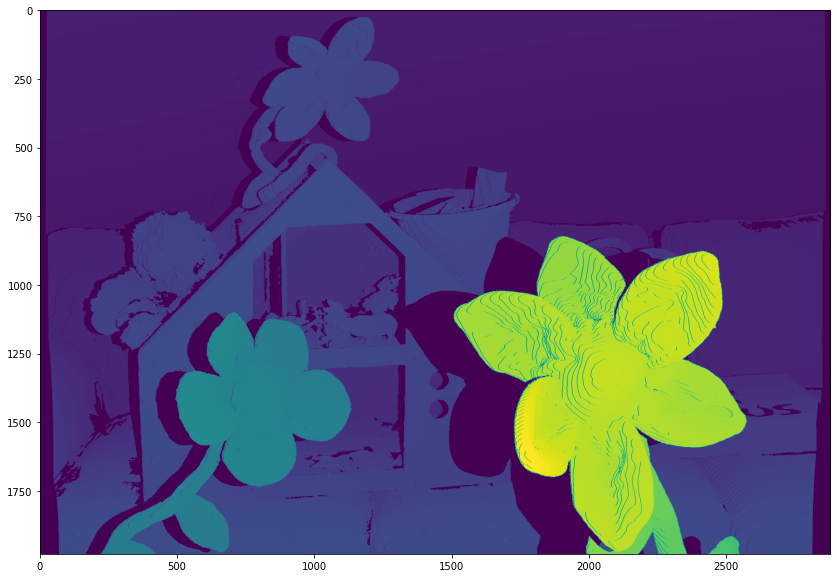

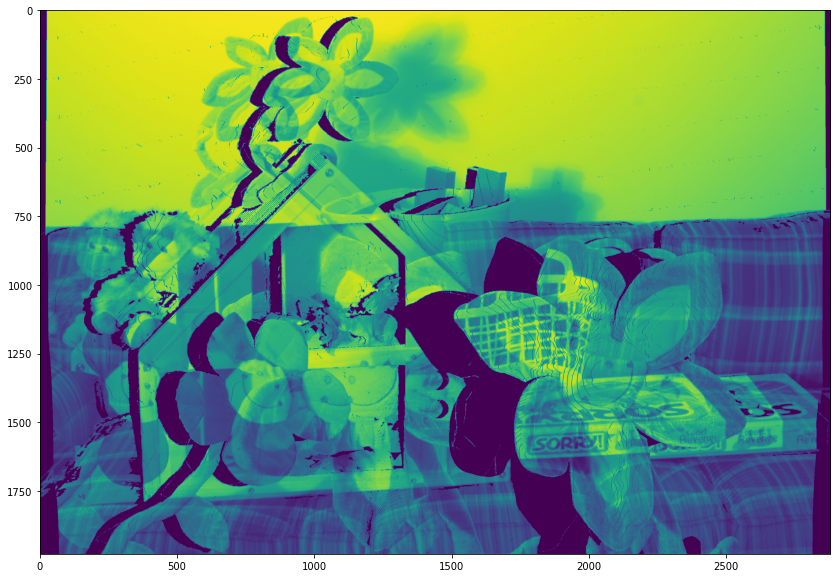

In [ ]:
print(new_image.shape)
test = new_image[:,:,0]
print(test.shape)
plt.imshow(new_image[:,:,1])
plt.show()
plt.imshow(test)

# OPTIONAL:  Depth map fusion Anlisys

This task is intended to bridge the concepts from novel and traditional applications. You must not implement any code but you are asked to review 2 papers:

- [B. Curless and M. Levoy. A Volumetric Method for Building Complex Models from Range Images. In Proc. SIGGRAPH, 1996](https://graphics.stanford.edu/papers/volrange/volrange.pdf).
- [RoutedFusion: Learning Real-time Depth Map Fusion Silvan Weder, Johannes L. Schönberger, Marc Pollefeys, Martin R. Oswald May 2020](https://www.silvanweder.com/publications/routed-fusion/)

You should provide a brief report Max 3 pages, less is preffered, where you make a detailed comparison between the two methods.
- Pay special attention to what concepts are shared between both approaches along the entire processing pipeline.
- What role play NN based function approximators in the entire processing pipeline of the second paper.How do they relate to the first approach? 

![image](https://user-images.githubusercontent.com/8356912/151363747-ae8ab96a-8eb9-4b56-b797-2eddf72f3e9c.png)



<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=635a34fa-7f2a-410d-af3a-b253b163fd90' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>